##Possible useful resources

https://ieeexplore-ieee-org.myaccess.library.utoronto.ca/stamp/stamp.jsp?tp=&arnumber=7364755
https://www-scientific-net.myaccess.library.utoronto.ca/AMR.301-303.143.pdf
https://journals.sagepub.com/doi/pdf/10.1155/2014/318635
https://journals-scholarsportal-info.myaccess.library.utoronto.ca/pdf/01651684/v88i0012/2943_tsscalsoba2h.xml
http://www.aei.tuke.sk/papers/2011/4/06_Kr%C5%A1%C3%A1k.pdf
https://ieeexplore-ieee-org.myaccess.library.utoronto.ca/stamp/stamp.jsp?tp=&arnumber=6335478
https://www-scientific-net.myaccess.library.utoronto.ca/AMR.301-303.143.pdf

# New Section

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


#Import and initialize the project

In [ ]:
from google.colab import drive
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2481581916784_.pic.jpg")
modifyIm = im.copy()
avgR = np.average(modifyIm[:, :, 0])
avgG = np.average(modifyIm[:, :, 1])
avgB = np.average(modifyIm[:, :, 2])

#Seperate the image to RGB three channels.

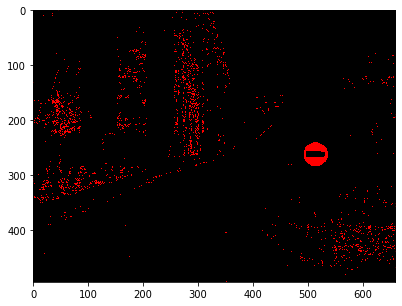

In [ ]:
modifyIm = im.copy()

plt.figure(figsize=(15,5))

for i in range(len(modifyIm)):
    for j in range(len(modifyIm[0])):
        if modifyIm[i][j][0] > avgR and modifyIm[i][j][1] < avgG and modifyIm[i][j][2] < avgB:
            modifyIm[i][j][0] = 255
        else:
            modifyIm[i][j][0] = 0
        modifyIm[i][j][1] = 0
        modifyIm[i][j][2] = 0

plt.imshow(modifyIm)

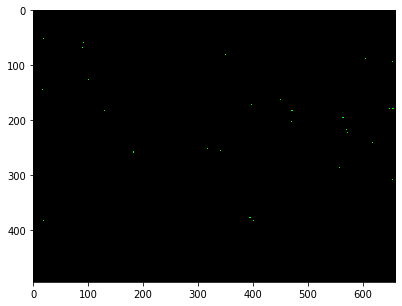

In [ ]:
modifyIm = im.copy()

plt.figure(figsize=(15,5))

for i in range(len(modifyIm)):
    for j in range(len(modifyIm[0])):
        if modifyIm[i][j][1] > avgG and modifyIm[i][j][0] < avgR and modifyIm[i][j][2] < avgB:
            modifyIm[i][j][1] = 255
        else:
            modifyIm[i][j][1] = 0
        modifyIm[i][j][0] = 0
        modifyIm[i][j][2] = 0

plt.imshow(modifyIm)

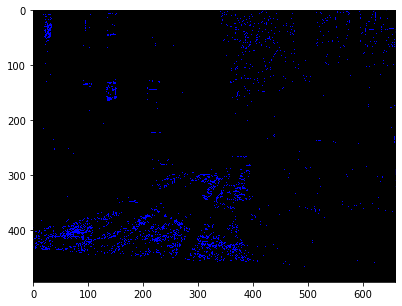

In [ ]:
modifyIm = im.copy()

plt.figure(figsize=(15,5))

for i in range(len(modifyIm)):
    for j in range(len(modifyIm[0])):
        if modifyIm[i][j][2] > avgB and modifyIm[i][j][0] < avgR and modifyIm[i][j][1] < avgG:
            modifyIm[i][j][2] = 255
        else:
            modifyIm[i][j][2] = 0
        modifyIm[i][j][0] = 0
        modifyIm[i][j][1] = 0

plt.imshow(modifyIm)

#Convert image to grayscale

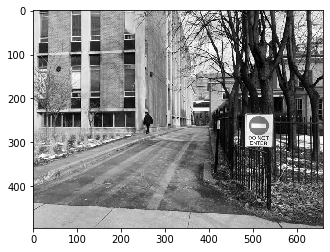

In [ ]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

modifyIm = im.copy()
gray = rgb2gray(modifyIm)
plt.imshow(gray, cmap='gray', vmin=0, vmax=255)

#Try isolating white and black color

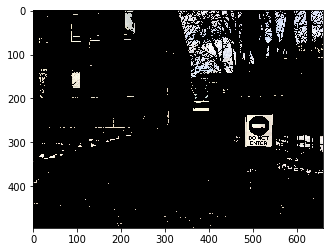

In [ ]:
modifyIm = im.copy()
gray = rgb2gray(modifyIm)
offset = abs(modifyIm[:,:,0] - gray) + abs(modifyIm[:,:,1] - gray) + abs(modifyIm[:,:,2] - gray)
# print(offset)
# gray2 = gray[np.sum(modifyIm) - gray * 3 > 100] = 0
lightened = np.sum(modifyIm,2) > 200 * 3
grayed = offset < 15 * 3
whiteCri = lightened * grayed
offset[whiteCri] = 255
modifyIm[offset != 255,:] = 0
plt.imshow(modifyIm)

#RGB to YCbCr

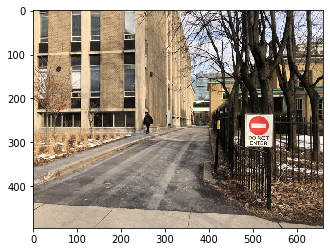

In [ ]:
modifyIm = im.copy()
plt.imshow(modifyIm)

In [ ]:
def rgb2ycbcr(im):
    xform = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
    ycbcr = im.dot(xform.T)
    ycbcr[:,:,[1,2]] += 127
    return np.uint8(ycbcr)

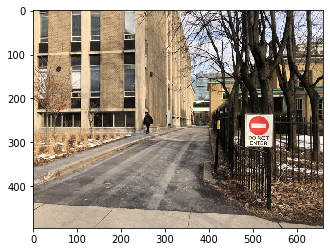

In [ ]:
modifyIm = im.copy()
plt.imshow(modifyIm)
modifyIm = rgb2ycbcr(modifyIm)

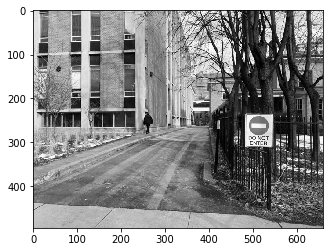

In [ ]:
plt.imshow(modifyIm[:,:,0], cmap='gray')

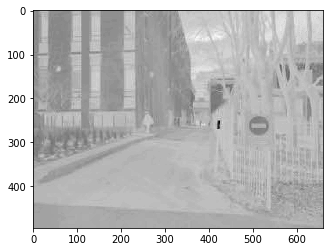

In [ ]:
plt.imshow(modifyIm[:,:,1], cmap='gray')

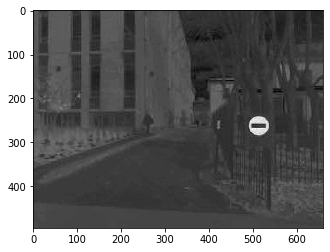

In [ ]:
plt.imshow(modifyIm[:,:,2], cmap='gray')

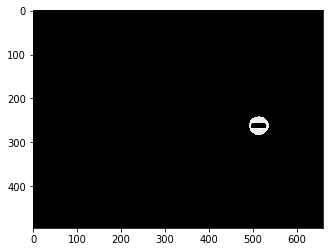

In [ ]:
modifyIm = im.copy()
modifyIm = rgb2ycbcr(modifyIm)
modifyIm[modifyIm[:,:,2] < 180] = 0
plt.imshow(modifyIm[:,:,2], cmap='gray')

# RGB to HSV color space

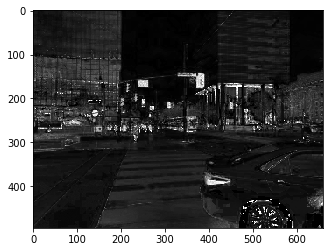

In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2521582072850_.pic.jpg")
modifyIm = im.copy()
modifyIm = matplotlib.colors.rgb_to_hsv(modifyIm)
# print(modifyIm)
plt.imshow(modifyIm[:,:,1], cmap='gray')

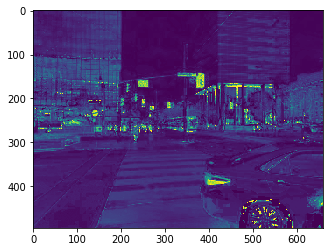

In [ ]:
modifyIm = im.copy()
modifyIm = matplotlib.colors.rgb_to_hsv(modifyIm)
# print(modifyIm)
plt.imshow(modifyIm[:,:,1])

#RGB to CMYK

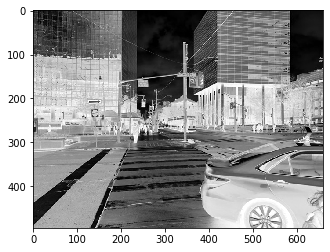

In [ ]:
image = Image.open("/content/drive/My Drive/aps360/project_image/localization/2521582072850_.pic.jpg")
cmyk_image = image.convert('CMYK')
cmyk_image = np.array(cmyk_image)

channelSum = np.sum(cmyk_image, 2) / 3

plt.imshow(channelSum, cmap='gray')

#Scipy sliding window convolve

In [ ]:
from scipy import signal

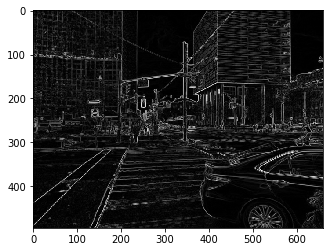

In [ ]:
scharr = np.array([[ -3-3j, 0-10j,  +3 -3j],
                    [-10+0j, 0+ 0j, +10 +0j],
                    [ -3+3j, 0+10j,  +3 +3j]]) # Gx + j*Gy
grad = signal.convolve2d(channelSum, scharr, boundary='symm', mode='same')
plt.imshow(np.absolute(grad), cmap='gray')

#Experiment

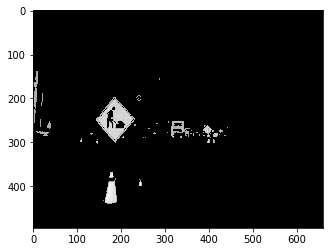

In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2511582072816_.pic.jpg")
modifyIm = im.copy()
modifyIm = rgb2ycbcr(modifyIm)
modifyIm[modifyIm[:,:,2] < 145] = 0
plt.imshow(modifyIm[:,:,2], cmap='gray')

# modifyIm = matplotlib.colors.rgb_to_hsv(modifyIm)
# plt.imshow(modifyIm[:,:,1])

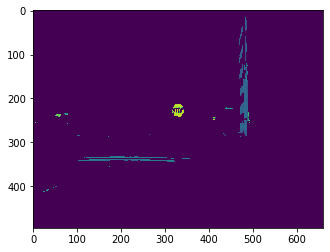

In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2551582072906_.pic.jpg")
modifyIm = im.copy()
modifyIm = rgb2ycbcr(modifyIm)
modifyIm[modifyIm[:,:,2] < 145] = 0
plt.imshow(modifyIm[:,:,2], cmap='gray')

modifyIm = matplotlib.colors.rgb_to_hsv(modifyIm)
plt.imshow(modifyIm[:,:,1])

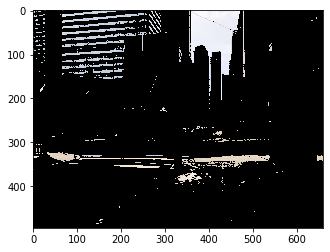

In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2551582072906_.pic.jpg")

modifyIm = im.copy()
gray = rgb2gray(modifyIm)
offset = abs(modifyIm[:,:,0] - gray) + abs(modifyIm[:,:,1] - gray) + abs(modifyIm[:,:,2] - gray)
# print(offset)
# gray2 = gray[np.sum(modifyIm) - gray * 3 > 100] = 0
lightened = np.sum(modifyIm,2) > 200 * 3
grayed = offset < 15 * 3
whiteCri = lightened * grayed
offset[whiteCri] = 255
modifyIm[offset != 255,:] = 0
plt.imshow(modifyIm)

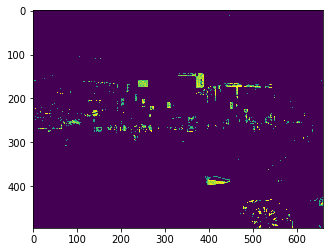

In [ ]:
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2521582072850_.pic.jpg")
modifyIm = im.copy()
# modifyIm = rgb2ycbcr(modifyIm)
# modifyIm[modifyIm[:,:,2] < 145] = 0
# plt.imshow(modifyIm[:,:,2], cmap='gray')

modifyIm = matplotlib.colors.rgb_to_hsv(modifyIm)
HSV_S = modifyIm[:,:,1]
HSV_S[HSV_S < 0.5] = 0
plt.imshow(HSV_S)

# FINAL Function

###Import

In [ ]:
from google.colab import drive
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image
drive.mount('/content/drive')

from scipy import signal
from scipy import ndimage
from skimage import filters
from skimage import measure
from skimage import transform
import cv2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Setting for the model

In [ ]:
MAX_HEIGHT = 495 # FIX height of the image no matter the size of the input
MIN_INTERESTED = 50 # minimal interested area: 100 pixel
MARGIN = 0.1

### Helper functions

In [ ]:
def findGradient(imgArr):
    scharr = np.array([[ -3-3j, 0-10j,  +3 -3j],
                        [-10+0j, 0+ 0j, +10 +0j],
                        [ -3+3j, 0+10j,  +3 +3j]]) # Gx + j*Gy
    grad = signal.convolve2d(imgArr, scharr, boundary='symm', mode='same')
    return grad
def rgb2ycbcr(im):
    im = im * 255
    xform = np.array([[.299, .587, .114], [-.1687, -.3313, .5], [.5, -.4187, -.0813]])
    ycbcr = im.dot(xform.T)
    ycbcr[:,:,[1,2]] += 127
    return np.uint8(ycbcr)

In [ ]:
from PIL import Image
import torchvision.models
from torchvision import transforms
import torch
import torch.nn as nn


In [ ]:
inception = torchvision.models.inception_v3(pretrained=True)
inception.eval()

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, t

In [ ]:
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
# input_image = Image.open("/content/drive/My Drive/aps360/project_image/localization/2511582072816_.pic.jpg")
input_image = Image.open("/content/drive/My Drive/aps360/project_image/localization/2481581916784_.pic.jpg")
# im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2511582072816_.pic.jpg")
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)
print(input_batch.shape)

incep_conv = nn.Sequential(*list(inception.children())[:-3])
incep_conv.eval()

output = incep_conv(input_batch)
print(output.size())

torch.Size([1, 3, 299, 299])


NameError: ignored

### Program Start Here

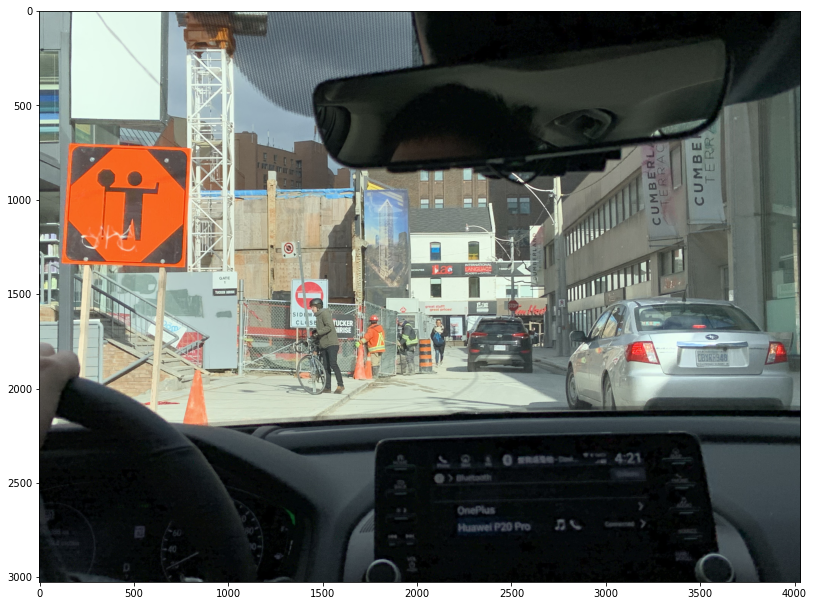

In [ ]:
# im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/2551582072906_.pic.jpg")
im = plt.imread("/content/drive/My Drive/aps360/project_image/localization/WechatIMG2127.jpeg")

fig,ax = plt.subplots(1)
fig.set_size_inches(18.5, 10.5, forward=True)
ax.imshow(im)
# if im.shape[1] != MAX_HEIGHT:
scalingFactor = MAX_HEIGHT / im.shape[1]
im = transform.resize(im, (MAX_HEIGHT, int (MAX_HEIGHT * im.shape[1] / im.shape[0])))

####First Stage: using HSV to try locate traffic sign

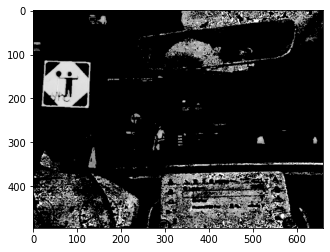

In [ ]:
modifyIm = im.copy()
HSVIm = matplotlib.colors.rgb_to_hsv(modifyIm)
HSV_V = HSVIm[:,:,2]
HSV_S = HSVIm[:,:,1]
HSV_S[HSV_S < 0.48] = 0
plt.imshow(HSV_S, cmap='gray')
HSV_S = filters.gaussian(HSV_S, sigma=5)

In [ ]:
# Find edge in the image
# grad_V = findGradient(HSV_V)
# grad_V = np.abs(grad_V)
# grad_V = filters.gaussian(grad_V, sigma=0.5)
# edge = grad_V > 4
# plt.imshow(edge, cmap='gray')

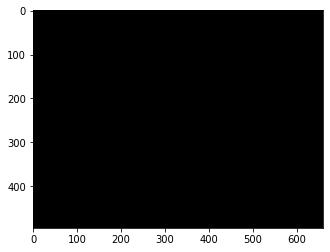

In [ ]:
blobs = (HSV_S > 14 * HSV_S.mean())
plt.imshow(blobs, cmap='gray')

####Second Stage: using YCbCR to try locate traffic sign

0.996345811051692


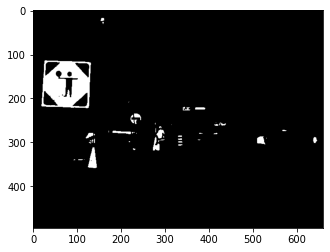

In [ ]:
modifyIm = im.copy()
print(np.max(modifyIm))

modifyIm_ycbcr = rgb2ycbcr(modifyIm)
modifyIm_ycbcr = modifyIm_ycbcr / 255
modifyIm_ycbcr = modifyIm_ycbcr[:,:,2]
modifyIm_ycbcr[modifyIm_ycbcr > 0.62] = 1
modifyIm_ycbcr[modifyIm_ycbcr < 0.62] = 0
plt.imshow(modifyIm_ycbcr, cmap='gray')

#### Third Stage: More coming...

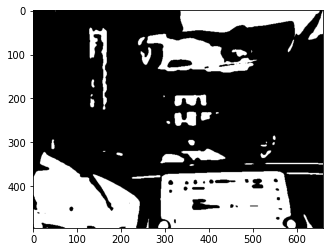

In [ ]:
fig, ax = plt.subplots()

modifyIm = im.copy()
# grayScale = HSV_V

deltaGray = HSV_V.copy()
colormat = HSV_V.copy()
varIm = np.var(modifyIm, axis=2)

for i in range(len(deltaGray)):
    for j in range(len(deltaGray[0])):
        deltaGray[i][j] = (abs(modifyIm[i][j][0] - HSV_V[i][j])\
                    +abs(modifyIm[i][j][1] - HSV_V[i][j])\
                    +abs(modifyIm[i][j][2] - HSV_V[i][j])) / 3

for i in range(len(deltaGray)):
    for j in range(len(deltaGray[0])):
        colormat = modifyIm[i][j][0]

setFlag1 = abs(deltaGray - HSV_V) > 0.75
setFlag2 = abs(deltaGray - HSV_V) < 0.1
notsetFlag2 = varIm > (0.001)
setFlag = setFlag1 + setFlag2
notsetFlag = ~setFlag + notsetFlag2
deltaGray[setFlag] = 1
deltaGray[notsetFlag] = 0

deltaGray = filters.gaussian(deltaGray, sigma=3)
deltaGray[deltaGray < 0.55 * np.max(deltaGray)] = 0
deltaGray[deltaGray > 0.55 * np.max(deltaGray)] = 1
ax.imshow(deltaGray, cmap='gray')

#### Combine two output and detect

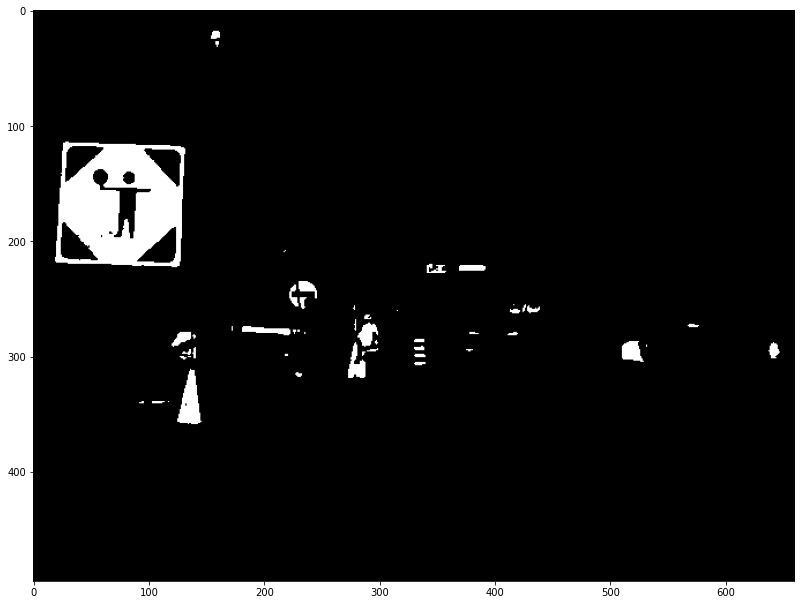

In [ ]:
# combinedBlobs = blobs + modifyIm_ycbcr + deltaGray
combinedBlobs = blobs + modifyIm_ycbcr
combinedBlobs[combinedBlobs>=1] = 1
fig,ax = plt.subplots(1)
fig.set_size_inches(18.5, 10.5, forward=True)

ax.imshow(combinedBlobs, cmap='gray')

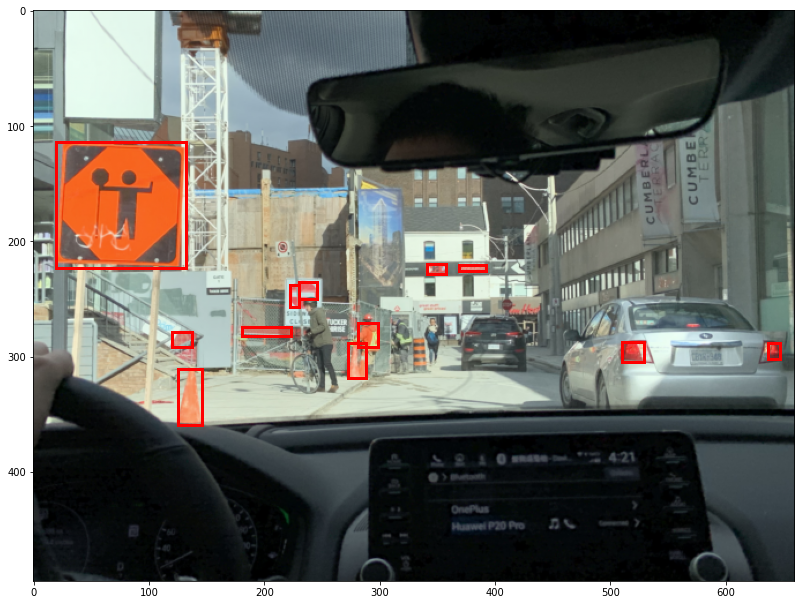

In [ ]:
fig,ax = plt.subplots(1)
fig.set_size_inches(18.5, 10.5, forward=True)

ax.imshow(im)


all_labels = measure.label(combinedBlobs)
blobs_labels = measure.label(combinedBlobs, background=0)
maxLabel = np.max(blobs_labels)

interesetedArea = []
for i in range(1, maxLabel + 1):
    areaDetail = np.where(blobs_labels == i)
    area = len(areaDetail[0])

    if(area < MIN_INTERESTED):
        blobs_labels[blobs_labels == i] = 0
        continue
    # minrow, maxrow, mincol, maxcol
    areaLocation = [np.min(areaDetail[0]), np.max(areaDetail[0]), np.min(areaDetail[1]), np.max(areaDetail[1])]

    if(areaLocation[0] < len(combinedBlobs) * MARGIN or areaLocation[1] > len(combinedBlobs) - len(combinedBlobs) * MARGIN or
       areaLocation[2] < len(combinedBlobs[0]) * MARGIN or areaLocation[3] > len(combinedBlobs[0]) - len(combinedBlobs[0]) * MARGIN):
       blobs_labels[blobs_labels == i] = 0
       continue

    areaCandidate = (areaLocation[1] - areaLocation[0] + 1) * (areaLocation[3] - areaLocation[2] + 1)

    rect = patches.Rectangle((areaLocation[2], areaLocation[0]),
                             areaLocation[3] - areaLocation[2] + 1, areaLocation[1] - areaLocation[0] + 1, 
                             linewidth=3,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    interesetedArea.append(areaLocation)

plt.show()
# plt.imshow(blobs_labels, cmap='nipy_spectral')

In [ ]:
#minrow, maxrow, mincol, maxcol
for singleArea in interesetedArea:
    print(singleArea)

[203, 299, 144, 231]
[252, 287, 315, 342]
[263, 280, 388, 406]
[279, 287, 411, 419]
[368, 380, 175, 182]
[388, 399, 241, 246]
[389, 438, 163, 191]


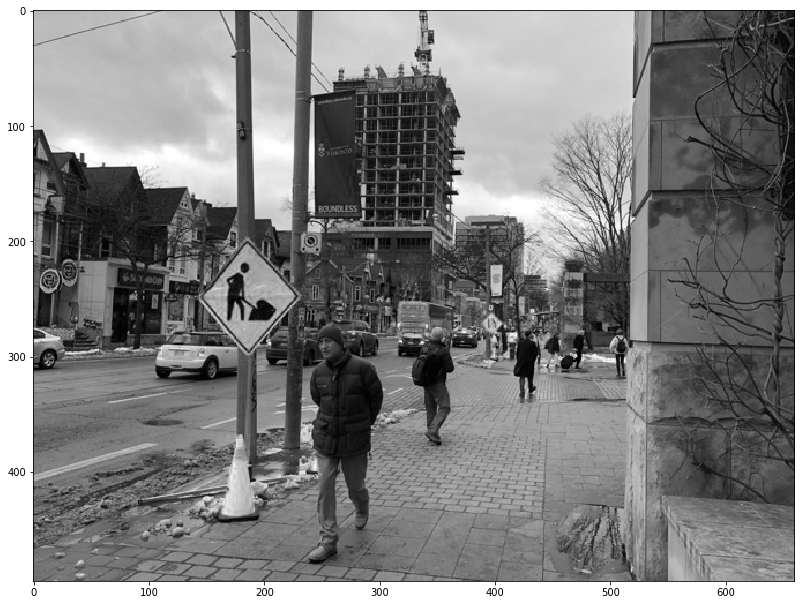

In [ ]:
# grad_V = findGradient(HSV_V)
# grad_S = np.absolute(grad)

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5, forward=True)
ax.imshow(np.abs(HSV_V), cmap='gray')
fig.savefig('test.png')

#### Small dataset augmentation

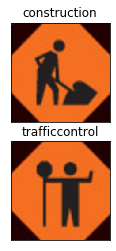

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/small_dataset/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

classes = ['construction', 'trafficcontrol']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(2):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])

In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/small_dataset/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    #images[i] = resize(images[i], (224, 224))
    horiz = np.fliplr(image)
    plt.imshow(horiz)
    plt.show()
    mpimg.imsave(model_path  + classes[labels[i]] +'/horiz.jpg', horiz)
    vert = np.flipud(image)
    plt.imshow(vert)
    plt.show()
    mpimg.imsave(model_path + classes[labels[i]] +'/vert.jpg', vert)
    rotate_angles = [30, 45, 120]
    for j in range(0, 3):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[i], rotate_angles[i]))      
      mpimg.imsave(model_path + classes[labels[i]] +'/rotate' + str(j) +'.jpg', rotate)
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] +'/noise' + str(j) +'.jpg', noise)

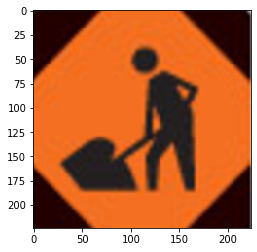

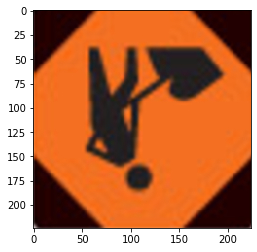

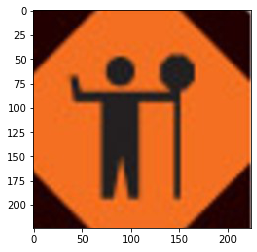

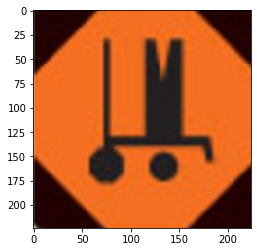

In [ ]:
data_augmentation(images)

#### CNN primary model

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt
from torchvision import datasets, models, transforms
from torch.utils.data import TensorDataset

In [ ]:
class CNN(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*220*220),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*110*110),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*106*106),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*53*53).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN"
          super(CNN, self).__init__()
          self.conv1 = nn.Conv2d(3, 5, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(5, 10, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(10*53*53, 32)
          self.fc2 = nn.Linear(32, 2)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 10*53*53)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          return x

#### Sanity check

In [ ]:
def get_accuracy_small(model, small_dataloader):
    data = small_dataloader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]

    return correct / total

In [ ]:
def train_small(model, batch_size=27, learning_rate=0.001, num_epochs=1):
    #train_loader = torch.utils.data.DataLoader(data, batch_size=batch_size)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    iters, losses, train_acc = [], [], []

    small_dataloader = torch.utils.data.DataLoader(small_dataset, batch_size=27, 
                                              shuffle=True)

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(small_dataloader):
          
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
            
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch

        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy_small(model, small_dataloader)) # compute training accuracy 
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch])
        if get_accuracy_small(model, small_dataloader) == 1:
          break

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))

CUDA is not available.  Training on CPU ...
epoch number  1 accuracy:  0.5
epoch number  2 accuracy:  0.5
epoch number  3 accuracy:  0.5
epoch number  4 accuracy:  0.5
epoch number  5 accuracy:  0.5
epoch number  6 accuracy:  0.5
epoch number  7 accuracy:  0.5
epoch number  8 accuracy:  0.5
epoch number  9 accuracy:  0.5
epoch number  10 accuracy:  0.5
epoch number  11 accuracy:  0.5
epoch number  12 accuracy:  0.5
epoch number  13 accuracy:  0.9444444444444444
epoch number  14 accuracy:  0.9444444444444444
epoch number  15 accuracy:  0.9444444444444444
epoch number  16 accuracy:  0.9444444444444444
epoch number  17 accuracy:  0.9444444444444444
epoch number  18 accuracy:  1.0


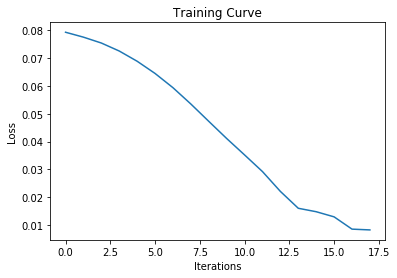

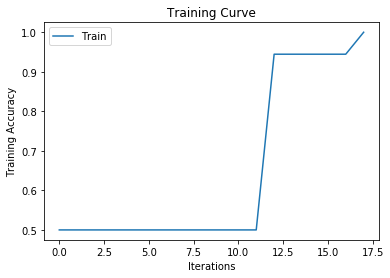

Final Training Accuracy: 1.0


In [ ]:
small_path = '/content/drive/My Drive/aps360/small_dataset/'
small_dataset = torchvision.datasets.ImageFolder(small_path, transform=transforms.ToTensor())

model = CNN()

use_cuda = False

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train_small(model, num_epochs=200)

#### large dataset augmentation

In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/large_dataset/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
large_images, labels = dataiter.next()
large_images = large_images.numpy() # convert images to numpy for display

classes = ['construction', 'trafficcontrol']

In [ ]:
from torchvision import transforms
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def large_data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/large_dataset/'
  torch.manual_seed(1)
  for i in range(len(images)):
    print(classes[labels[i]])
    image = np.transpose(images[i], (1, 2, 0))
    plt.imshow(image)
    plt.show()
    horiz = np.fliplr(image)
    mpimg.imsave(model_path  + classes[labels[i]] +'/horiz.jpg', horiz)
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] +'/vert.jpg', vert)
    rotate_angles = range(10, 140, 5)
    for k in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[k], rotate_angles[k]))      
      mpimg.imsave(model_path + classes[labels[i]] +'/rotate' + str(k) +'.jpg', rotate)
    for j in range(0, 50):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] +'/noise' + str(j) +'.jpg', noise)

construction


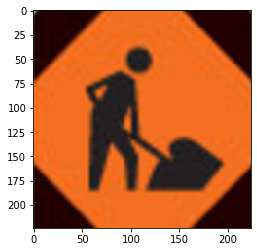

trafficcontrol


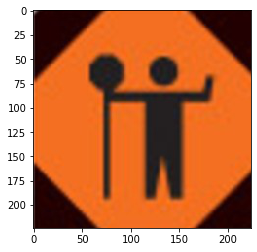

In [ ]:
large_data_augmentation(large_images)

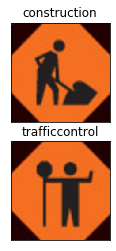

In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/val_dataset/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
val_images, val_labels = dataiter.next()
val_images = val_images.numpy() # convert images to numpy for display


classes = ['construction', 'trafficcontrol']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(2):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(val_images[idx], (1, 2, 0)))
    ax.set_title(classes[val_labels[idx]])

In [ ]:
#from torchvision import transforms
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def val_data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/val_dataset/'
  torch.manual_seed(1)
  for i in range(0, len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    plt.imshow(image)
    plt.show()
    horiz = np.fliplr(image)
    mpimg.imsave(model_path  + classes[val_labels[i]] +'/horiz.jpg', horiz)
    print(classes[val_labels[i]])
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[val_labels[i]] +'/vert.jpg', vert)
    rotate_angles = range(0, 50, 5)
    for k in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[k], rotate_angles[k]))      
      mpimg.imsave(model_path + classes[val_labels[i]] +'/rotate' + str(k) +'.jpg', rotate)
    for j in range(0, 20):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[val_labels[i]] +'/noise' + str(j) +'.jpg', noise)

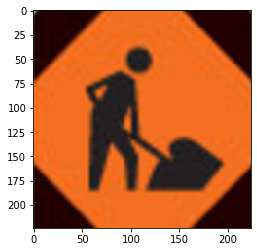

construction


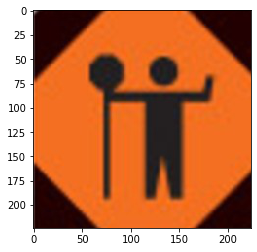

trafficcontrol


In [ ]:
val_data_augmentation(val_images)

In [ ]:
def get_accuracy(model, train_loader, valid_loader, train=False):
    if train:
        data = train_loader
    else:
        data = valid_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
def train(model, train_dataset, valid_dataset, batch_size=64, learning_rate=0.001, num_epochs=1):
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):
          
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch


        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
       

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is not available.  Training on CPU ...
10
5
epoch number  1 accuracy:  0.8291139240506329
epoch number  2 accuracy:  0.9177215189873418
epoch number  3 accuracy:  0.9050632911392406
epoch number  4 accuracy:  0.879746835443038
epoch number  5 accuracy:  0.9556962025316456
epoch number  6 accuracy:  0.9746835443037974


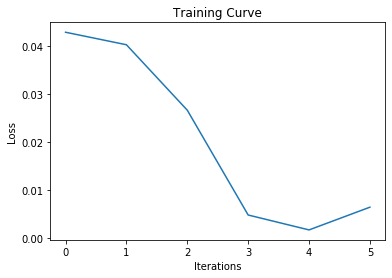

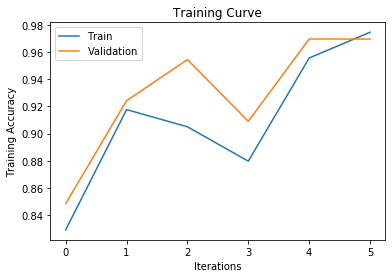

Final Training Accuracy: 0.9746835443037974
Final Validation Accuracy: 0.9696969696969697


In [ ]:
train_path = '/content/drive/My Drive/aps360/large_dataset/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/val_dataset/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN()

use_cuda = False

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train(model, train_dataset, val_dataset, 16, 0.005, num_epochs=6)

CUDA is not available.  Training on CPU ...
10
5
epoch number  1 accuracy:  0.9620253164556962
epoch number  2 accuracy:  0.8734177215189873
epoch number  3 accuracy:  0.9683544303797469
epoch number  4 accuracy:  0.9683544303797469
epoch number  5 accuracy:  0.9810126582278481
epoch number  6 accuracy:  0.9240506329113924
epoch number  7 accuracy:  0.9810126582278481
epoch number  8 accuracy:  0.9873417721518988
epoch number  9 accuracy:  0.9936708860759493
epoch number  10 accuracy:  0.9936708860759493


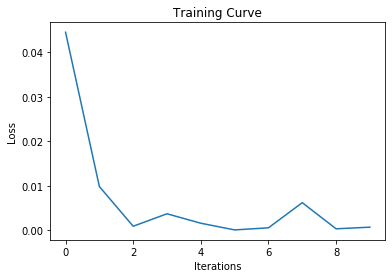

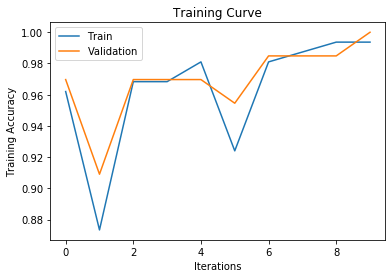

Final Training Accuracy: 0.9936708860759493
Final Validation Accuracy: 1.0


In [ ]:
train_path = '/content/drive/My Drive/aps360/large_dataset/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/val_dataset/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN()

use_cuda = False

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train(model, train_dataset, val_dataset, 16, 0.005, num_epochs=10)

CUDA is not available.  Training on CPU ...
10
5
epoch number  1 accuracy:  0.5
epoch number  2 accuracy:  0.8291139240506329
epoch number  3 accuracy:  0.9430379746835443
epoch number  4 accuracy:  0.9113924050632911
epoch number  5 accuracy:  0.9620253164556962
epoch number  6 accuracy:  0.9683544303797469
epoch number  7 accuracy:  0.9683544303797469
epoch number  8 accuracy:  0.9493670886075949
epoch number  9 accuracy:  0.9683544303797469
epoch number  10 accuracy:  0.9493670886075949
epoch number  11 accuracy:  0.9683544303797469
epoch number  12 accuracy:  0.9240506329113924
epoch number  13 accuracy:  0.9683544303797469
epoch number  14 accuracy:  0.9746835443037974
epoch number  15 accuracy:  0.9746835443037974
epoch number  16 accuracy:  0.9746835443037974
epoch number  17 accuracy:  0.9810126582278481
epoch number  18 accuracy:  0.9810126582278481
epoch number  19 accuracy:  0.9810126582278481
epoch number  20 accuracy:  0.9746835443037974
epoch number  21 accuracy:  0.97468

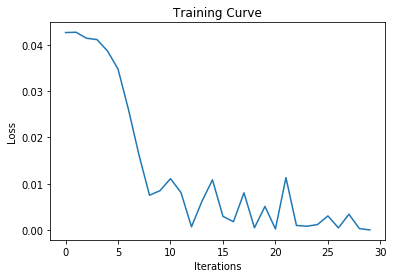

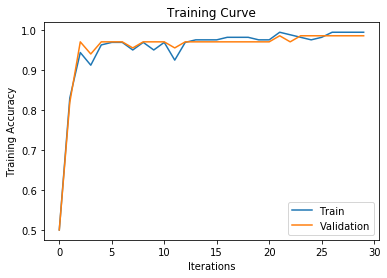

Final Training Accuracy: 0.9936708860759493
Final Validation Accuracy: 0.9848484848484849


In [ ]:
train_path = '/content/drive/My Drive/aps360/large_dataset/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/val_dataset/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN()

use_cuda = False

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train(model, train_dataset, val_dataset, 16, 0.0005, num_epochs=30)

#### Primary Model Test

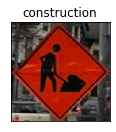

In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_dataset/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display

classes = ['construction', 'trafficcontrol']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(1):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))
    ax.set_title(classes[test_labels[idx]])

In [ ]:
def get_test_accuracy(model, test_loader):
    data = test_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        print(output)
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total


In [ ]:
best_model = CNN()
best_model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format("CNN", 16, 0.005, 5)
state = torch.load(best_model_path)
best_model.load_state_dict(state)
if use_cuda and torch.cuda.is_available():
    best_model.cuda()

test_dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
test_accuracy = get_test_accuracy(best_model, test_dataloader)
print("test accuracy:", test_accuracy)

tensor([[ 0.9247, -1.0191]], grad_fn=<AddmmBackward>)
test accuracy: 1.0


#### More image data augmentations

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/new_train_dataset/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

classes = ['construction', 'trafficcontrol']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(2):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])

FileNotFoundError: ignored

In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def large_data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/new_train_dataset/'
  torch.manual_seed(1)
  for i in range(len(images)):
    print(classes[labels[i]])
    image = np.transpose(images[i], (1, 2, 0))
    plt.imshow(image)
    plt.show()
    horiz = np.fliplr(image)
    mpimg.imsave(model_path  + classes[labels[i]] +'/horiz.jpg', horiz)
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] +'/vert.jpg', vert)
    rotate_angles = range(10, 45, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] +'/rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 50):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] +'/noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] +'/change_color' + str(index3) +'.jpg', change_color)

construction


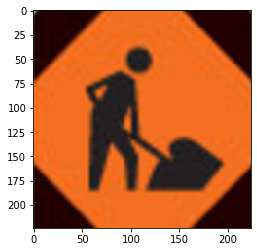

trafficcontrol


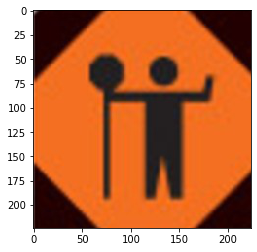

In [ ]:
large_data_augmentation(images)

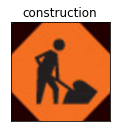

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_scaling/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 2
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

classes = ['construction']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(1):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])

In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

ValueError: ignored

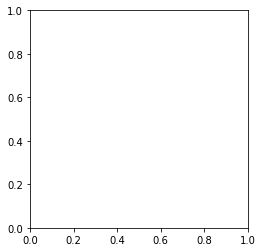

In [ ]:
image = np.transpose(images[0], (1, 2, 0))
model_path = '/content/drive/My Drive/aps360/test_scaling/'


loader_crop = torchvision.transforms.CenterCrop((200, 200))
#mpimg.imsave(model_path + classes[labels[0]] +'/enlarge' + str(1) +'.jpg', loader_crop)
plt.imshow('/content/drive/My Drive/aps360/test_scaling/construction/construction.jpg', loader_crop)

#### CNN for small cropped image

In [ ]:
import os
drive.mount('/content/drive')
# handle the data, divided into train, validation and test
# location on Google Drive
data_path_0 = '/content/drive/My Drive/project_new/project_images_ns/ns/'
data_path_1 = '/content/drive/My Drive/project_new/project_images_signs/signs/'

# rename pictures
i = 0
for item in os.listdir(data_path_0):#进入到文件夹内，对每个文件进行循环遍历
  os.rename(os.path.join(data_path_0,item),os.path.join(data_path_0,('ns'+str(i)+'.jpg')))#os.path.join(path_name,item)表示找到每个文件的绝对路径并进行拼接操作
  i += 1
i = 0
for item in os.listdir(data_path_1):#进入到文件夹内，对每个文件进行循环遍历
  os.rename(os.path.join(data_path_1,item),os.path.join(data_path_1,('s'+str(i)+'.jpg')))#os.path.join(path_name,item)表示找到每个文件的绝对路径并进行拼接操作
  i += 1



Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


FileNotFoundError: ignored

In [ ]:
# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((80,80)), 
                                transforms.ToTensor()])
data_path_0 = '/content/drive/My Drive/project_new/project_images_ns/'
data_path_1 = '/content/drive/My Drive/project_new/project_images_signs/'

# Load data from Google Drive
dataset_0 = torchvision.datasets.ImageFolder(data_path_0, transform=transform)
dataset_1 = torchvision.datasets.ImageFolder(data_path_1, transform=transform)
 
old_dataset = dataset_1
dataset_expand = []
for item in dataset_1:
  dataset_expand.append(item)
dataset_1 = old_dataset + dataset_expand * 22

# data augmentation
# Prepare Dataloader
batch_size = 2
num_workers = 1
tmp_data_loader = torch.utils.data.DataLoader(dataset_1, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(tmp_data_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

In [ ]:
def CNN_data_augmentation(images):
  model_path = '/content/drive/My Drive/project_new/project_images_signs/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    horiz = np.fliplr(image)
    mpimg.imsave(model_path +'/horiz.jpg', horiz)
    vert = np.flipud(image)
    mpimg.imsave(model_path +'/vert.jpg', vert)
    rotate_angles = range(10, 45, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path +'/rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 50):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path +'/noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path +'/change_color' + str(index3) +'.jpg', change_color)

In [ ]:
# augmentation 
# the number of images having the signs is far less than images without signs
# CNN_data_augmentation(images)

In [ ]:
import os
import time
import matplotlib.pyplot as plt
from google.colab import drive
import numpy as np

import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

def get_relevant_indices(dataset, classes, target_classes):
    """ Return the indices for datapoints in the dataset that belongs to the
    desired target classes, a subset of all possible classes.

    Args:
        dataset: Dataset object
        classes: A list of strings denoting the name of each class
        target_classes: A list of strings denoting the name of desired classes
                        Should be a subset of the 'classes'
    Returns:
        indices: list of indices that have labels corresponding to one of the
                 target classes
    """
    indices = []
    for i in range(len(dataset)):
        # Check if the label is in the target classes
        label_index = dataset[i][1] # ex: 3
        label_class = classes[label_index] # ex: 'cat'
        if label_class in target_classes:
            indices.append(i)
    return indices


def make_weights_for_balanced_classes(images, nclasses):                        
    count = [0] * nclasses                                                      
    for item in images:                                                         
        count[item[1]] += 1                                                     
    weight_per_class = [0.] * nclasses                                      
    N = float(sum(count))                                                   
    for i in range(nclasses):                                                   
        weight_per_class[i] = N/float(count[i])                                 
    weight = [0] * len(images)                                              
    for idx, val in enumerate(images):                                          
        weight[idx] = weight_per_class[val[1]]                                  
    return weight               

def get_data_loader(target_classes, batch_size, path="/content/drive/My Drive/project_new/", trainP = 0.8, valP = 0.1, testP = 0.1):
    """ Returns the indices for datapoints in the dataset that
    belongs to the desired target classes, a subset of all possible classes.

    Args:
        dataset: Dataset object
        classes: A list of strings denoting the name of each class
        target_classes: A list of strings denoting the name of the desired
                        classes. Should be a subset of the argument 'classes'
    Returns:
        indices: list of indices that have labels corresponding to one of the
                 target classes
    """
    print('[INFO] Get DATA start.')
    classes = ('signs', 'no_signs')
    ########################################################################
    # The output of torchvision datasets are PILImage images of range [0, 1].
    # We transform them to Tensors of normalized range [-1, 1].
    transform = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    imageData = torchvision.datasets.ImageFolder(path, transform=transform)
    # imageData = torchvision.datasets.ImageFolder('/content/drive/My Drive/aps360/Gesture_Dataset/', transform=transform)
    
    # need to balance the training, validation and test samples size the same. 80%, 10%, 10%
    relevant_train_indices, relevant_val_indices, relevant_test_indices = [], [], []

    for subClass in classes:
      print('[INFO] Sets for \'' + subClass + '\' START.')
      # Get the list of indices to sample from
      train_indices = get_relevant_indices(
              imageData,
              classes,
              [subClass])
      
      # Split into train and validation

    #   np.random.seed(1000) # Fixed numpy random seed for reproducible shuffling

      
      np.random.shuffle(train_indices)

      validationSplit = int(len(train_indices) * trainP)
      testSplit = int(len(train_indices) * (trainP + valP))

      addtional_relevant_train_indices, addtional_relevant_val_indices, addtional_relevant_test_indices = \
        train_indices[:validationSplit], train_indices[validationSplit:testSplit], train_indices[testSplit:]
      
      relevant_train_indices.extend(addtional_relevant_train_indices)
      relevant_val_indices.extend(addtional_relevant_val_indices)
      relevant_test_indices.extend(addtional_relevant_test_indices)

      print('[INFO] Sets for \'' + subClass + '\' OK.')

                                                                       
                                                                                
    # For unbalanced dataset we create a weighted sampler                       
    weights = make_weights_for_balanced_classes(imageData.imgs, len(imageData.classes))                                                               
    weights = torch.DoubleTensor(weights)                                       
    sampler = torch.utils.data.sampler.WeightedRandomSampler(weights, len(weights))                     
                                                                                
    train_loader = torch.utils.data.DataLoader(imageData, batch_size=batch_size, sampler = sampler, num_workers=1)     

    # # train_sampler = SubsetRandomSampler(relevant_train_indices) 
    # # train_loader = torch.utils.data.DataLoader(imageData, batch_size=batch_size,
    # #                                            num_workers=1, sampler=train_sampler)
    
    val_sampler = SubsetRandomSampler(relevant_val_indices)
    val_loader = torch.utils.data.DataLoader(imageData, batch_size=batch_size,
                                              num_workers=1, sampler=val_sampler)
    
    test_sampler = SubsetRandomSampler(relevant_test_indices)
    test_loader = torch.utils.data.DataLoader(imageData, batch_size=batch_size,
                                             num_workers=1, sampler=test_sampler)
    
    # convert labels from 1 number to a 1-D vector tensor



    return train_loader, val_loader, test_loader





In [ ]:
# read data here
train_loader, val_loader, test_loader = get_data_loader(target_classes=['signs', 'no_signs'], batch_size=64)
print(len(train_loader))
print(len(val_loader))
print(len(test_loader))

[INFO] Get DATA start.
[INFO] Sets for 'signs' START.
[INFO] Sets for 'signs' OK.
[INFO] Sets for 'no_signs' START.
[INFO] Sets for 'no_signs' OK.
72
8
8


In [ ]:
class CNN(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*76*76),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*38*38),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*34*34),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*17*17).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN"
          super(CNN, self).__init__()
          self.conv1 = nn.Conv2d(3, 10, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(10, 20, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(20*17*17, 32)
          self.fc2 = nn.Linear(32, 1)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 20*17*17)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          x = x.squeeze(1)
          return x

In [ ]:
def get_accuracy(model, train_loader, valid_loader, train=False):
    if train:
        data = train_loader
    else:
        data = valid_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
def evaluate(model, loader, criterion):
    """ Evaluate the network on the validation set.

     Args:
         net: PyTorch neural network object
         loader: PyTorch data loader for the validation set
         criterion: The loss function
     Returns:
         err: A scalar for the avg classification error over the validation set
         loss: A scalar for the average loss function over the validation set
     """
    total_loss = 0.0
    total_err = 0.0
    total_epoch = 0
    i = 0
    for imgs, labels in loader:    
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        outputs = model(imgs)
        loss = criterion(outputs, labels.float())
        corr = (outputs > 0.0).squeeze().long() != labels
        total_err += int(corr.sum())
        total_loss += loss.item()
        total_epoch += len(labels)
        i += 1
    err = float(total_err) / total_epoch
    loss = float(total_loss) / (i + 1)
    return err, loss

In [ ]:
def train(model, train_loader, valid_loader, batch_size=64, learning_rate=0.001, num_epochs=1):
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []
    train_err = np.zeros(num_epochs)
    train_loss = np.zeros(num_epochs)
    val_err = np.zeros(num_epochs)
    val_loss = np.zeros(num_epochs)
    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        i = 0
        total_train_loss = 0.0
        total_train_err = 0.0
        total_epoch = 0
        for imgs, labels in iter(train_loader):
          
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels.float()) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch
            i += 1

        # # save the current training information
        # iters.append(epoch)
        # losses.append(float(loss)/batch_size)             # compute *average* loss
        # train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        # print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        # val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
            corr = (out > 0.0).squeeze().long() != labels
            total_train_err += int(corr.sum())
            total_train_loss += loss.item()
            total_epoch += len(labels)
        train_err[epoch] = float(total_train_err) / total_epoch
        train_loss[epoch] = float(total_train_loss) / (i+1)
        val_err[epoch], val_loss[epoch] = evaluate(model, valid_loader, criterion)
        print(("Epoch {}: Train err: {}, Train loss: {} |"+
               "Validation err: {}, Validation loss: {}").format(
                   epoch + 1,
                   train_err[epoch],
                   train_loss[epoch],
                   val_err[epoch],
                   val_loss[epoch]))
        # Save the current model (checkpoint) to a file
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model, model_path)
    plt.title("Train vs Validation Error")
    n = len(train_err) # number of epochs
    plt.plot(range(1,n+1), train_err, label="Train")
    plt.plot(range(1,n+1), val_err, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Error")
    plt.legend(loc='best')
    plt.show()
    plt.title("Train vs Validation Loss")
    plt.plot(range(1,n+1), train_loss, label="Train")
    plt.plot(range(1,n+1), val_loss, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()

    # plotting
    # plt.title("Training Curve")
    # plt.plot(iters, losses, label="Train")
    # plt.xlabel("Iterations")
    # plt.ylabel("Loss")
    # plt.show()

    # plt.title("Training Curve")
    # plt.plot(iters, train_acc, label="Train")
    # plt.plot(iters, val_acc, label="Validation")
    # plt.xlabel("Iterations")
    # plt.ylabel("Training Accuracy")
    # plt.legend(loc='best')
    # plt.show()

    # print("Final Training Accuracy: {}".format(train_acc[-1]))
    # print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is not available.  Training on CPU ...
72
8
Epoch 1: Train err: 0.42155584528465884, Train loss: 0.6757633432950059 |Validation err: 0.4434782608695652, Validation loss: 0.605661027961307


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:360: UserWarning: Couldn't retrieve source code for container of type CNN. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


Epoch 2: Train err: 0.3042155584528466, Train loss: 0.6521938255388443 |Validation err: 0.5260869565217391, Validation loss: 0.6374452577696906
Epoch 3: Train err: 0.2920469361147327, Train loss: 0.6192001896361782 |Validation err: 0.5217391304347826, Validation loss: 0.6289232108328078
Epoch 4: Train err: 0.2987831377661886, Train loss: 0.5751690178701322 |Validation err: 0.5065217391304347, Validation loss: 0.5288432141145071
Epoch 5: Train err: 0.24293785310734464, Train loss: 0.5114392372843337 |Validation err: 0.30869565217391304, Validation loss: 0.5023344821400113
Epoch 6: Train err: 0.18730986527596696, Train loss: 0.4705326789862489 |Validation err: 0.2847826086956522, Validation loss: 0.5134366982513003
Epoch 7: Train err: 0.1853541938287701, Train loss: 0.4630555571758584 |Validation err: 0.2391304347826087, Validation loss: 0.4371808038817512
Epoch 8: Train err: 0.17340286831812254, Train loss: 0.455871729409858 |Validation err: 0.23478260869565218, Validation loss: 0.46633

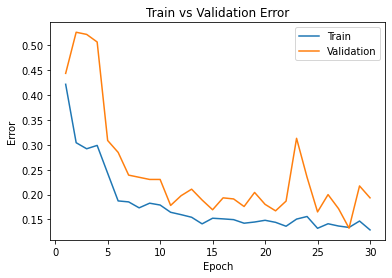

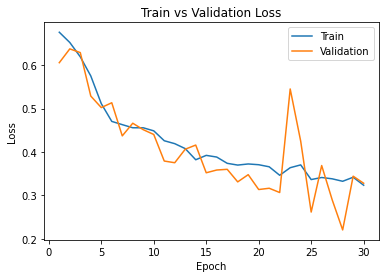

In [ ]:
model = CNN()

use_cuda = False

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train(model, train_loader, val_loader, 64, 0.0005, num_epochs=30)

1


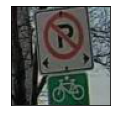

In [ ]:
# location on Google Drive
test_path = '/content/drive/My Drive/test/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((80,80)), 
                                transforms.ToTensor()])

# Load data from Google Drive
test_dataset = torchvision.datasets.ImageFolder(test_path, transform=transform)
print(len(test_dataset))

# Prepare Dataloader
batch_size = 1
num_workers = 1
test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(test_data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display



# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(1):
    ax = fig.add_subplot(2, 2/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))


In [ ]:
def get_test_accuracy(model, test_loader):
    data = test_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        print(output)
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total



In [ ]:
def evaluate(model, loader, criterion):
    """ Evaluate the network on the validation set.

     Args:
         net: PyTorch neural network object
         loader: PyTorch data loader for the validation set
         criterion: The loss function
     Returns:
         err: A scalar for the avg classification error over the validation set
         loss: A scalar for the average loss function over the validation set
     """
    total_loss = 0.0
    total_err = 0.0
    total_epoch = 0
    i = 0
    for imgs, labels in loader:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        outputs = model(imgs)
        loss = criterion(outputs, labels.float())
        corr = (outputs > 0.0).squeeze().long() != labels
        total_err += int(corr.sum())
        total_loss += loss.item()
        total_epoch += len(labels)
        i += 1
    err = float(total_err) / total_epoch
    loss = float(total_loss) / (i + 1)
    return err, loss

In [ ]:

if use_cuda and torch.cuda.is_available():
    model.cuda()

# # test_dataloader = torch.utils.data.DataLoader(test_loader, batch_size=1, shuffle=True)
# test_accuracy = get_test_accuracy(model, test_data_loader)
# print("test accuracy:", test_accuracy)
criterion = nn.BCEWithLogitsLoss()
terror, tloss = evaluate(model, test_data_loader, criterion)
print(("Test Error: {}, Test Loss: {}").format(
                   terror,
                   tloss))

Test Error: 0.0, Test Loss: 0.331775039434433


#### classification stage 1

312


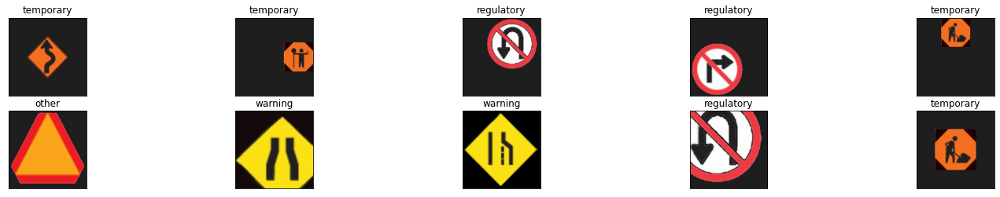

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/train_stage_1/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

classes = ['other', 'regulatory', 'temporary', 'warning']
print(len(images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def large_data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/train_stage_1/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    horiz = np.fliplr(image)
    mpimg.imsave(model_path  + classes[labels[i]] +  '/' + str(i) + 'horiz.jpg', horiz)
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 10):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
large_data_augmentation(images)

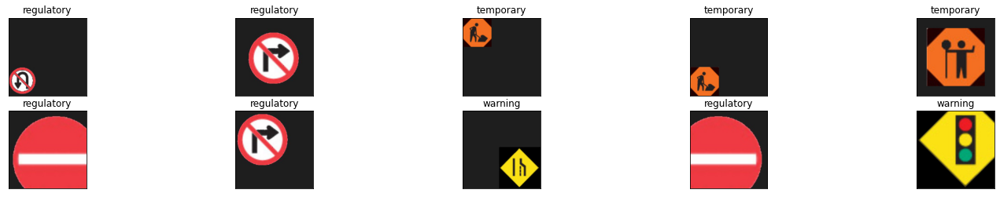

In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/valid_stage_1/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
val_images, val_labels = dataiter.next()
val_images = val_images.numpy() # convert images to numpy for display


classes = ['other', 'regulatory', 'temporary', 'warning']

# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(val_images[idx], (1, 2, 0)))
    ax.set_title(classes[val_labels[idx]])

In [ ]:
#from torchvision import transforms
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def val_data_augmentation(images):
  model_path = '/content/drive/My Drive/aps360/valid_stage_1/'
  torch.manual_seed(1)
  for i in range(0, len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    horiz = np.fliplr(image)
    mpimg.imsave(model_path  + classes[val_labels[i]] +'/' + str(i) + 'horiz.jpg', horiz)
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[val_labels[i]] +'/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(5, 15, 5)
    for k in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[k], rotate_angles[k]))      
      mpimg.imsave(model_path + classes[val_labels[i]] +'/' + str(i) + 'rotate' + str(k) +'.jpg', rotate)
    for j in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[val_labels[i]] +'/' + str(i) + 'noise' + str(j) +'.jpg', noise)

    for index3 in range(0, 5):
      change_in_color = (-10 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[val_labels[i]] +'/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
val_data_augmentation(val_images)

In [ ]:
class CNN(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*220*220),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*110*110),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*106*106),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*53*53).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN"
          super(CNN, self).__init__()
          self.conv1 = nn.Conv2d(3, 5, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(5, 10, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(10*53*53, 32)
          self.fc2 = nn.Linear(32, 4)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 10*53*53)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          return x

In [ ]:
def get_accuracy(model, train_loader, valid_loader, train=False):
    if train:
        data = train_loader
    else:
        data = valid_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
def train(model, train_dataset, valid_dataset, batch_size=64, learning_rate=0.001, num_epochs=1):
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):
          
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch


        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
       

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is available!  Training on GPU ...
32
16
epoch number  1 accuracy:  0.5239151873767258
epoch number  2 accuracy:  0.5490631163708086
epoch number  3 accuracy:  0.6458333333333334
epoch number  4 accuracy:  0.7152366863905325
epoch number  5 accuracy:  0.8004191321499013
epoch number  6 accuracy:  0.889792899408284
epoch number  7 accuracy:  0.9232001972386588
epoch number  8 accuracy:  0.9432938856015779
epoch number  9 accuracy:  0.969551282051282
epoch number  10 accuracy:  0.9746055226824457


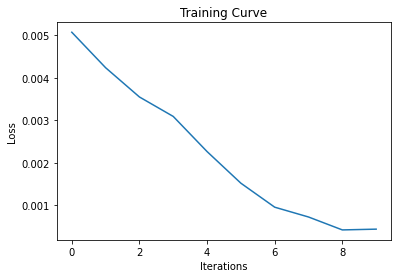

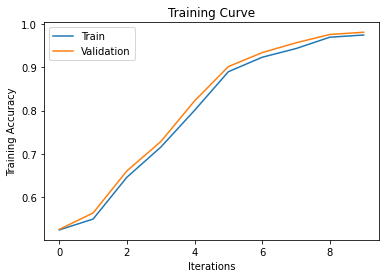

Final Training Accuracy: 0.9746055226824457
Final Validation Accuracy: 0.9810157790927022


In [ ]:
train_path = '/content/drive/My Drive/aps360/train_stage_1/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/valid_stage_1/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN()

use_cuda = True

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train(model, train_dataset, val_dataset, 256, 0.001, num_epochs=10)

8
0


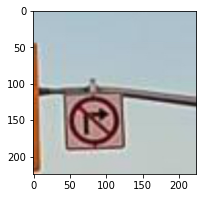

regulatory
1


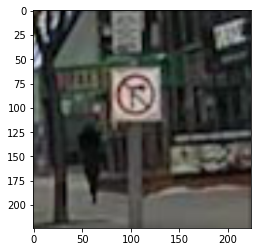

regulatory
2


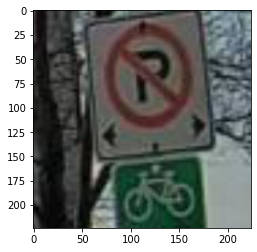

regulatory
3


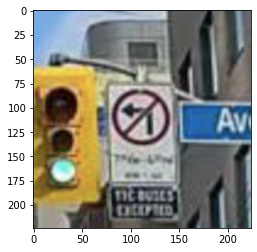

regulatory
4


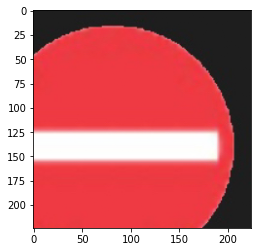

regulatory
5


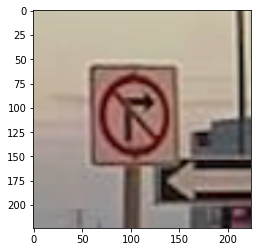

regulatory
6


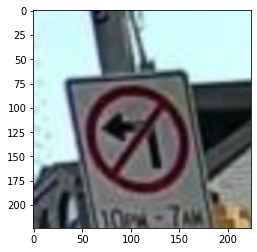

regulatory
7


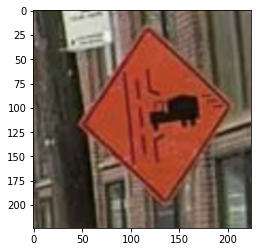

temporary


In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_1/'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = 8
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display
print(len(test_images))
classes = ['other', 'regulatory', 'temporary', 'warning']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 3))
for idx in np.arange(8):
    print(idx)
    #ax = fig.add_subplot(2, 8/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))
    plt.show()
    print(classes[test_labels[idx]])
    #ax.set_title(classes[test_labels[idx]])

In [ ]:
def get_test_accuracy(model, test_loader):
    data = test_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        imgs_1 = np.squeeze(imgs,axis = 0)
        print(imgs_1.shape)
        plt.imshow(np.transpose(imgs_1, (1, 2, 0)))
        plt.show()
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        print(output)
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total


torch.Size([3, 224, 224])


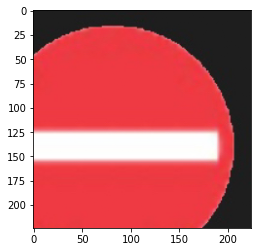

tensor([[-5.5720,  8.1660, -2.1404, -6.0543]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


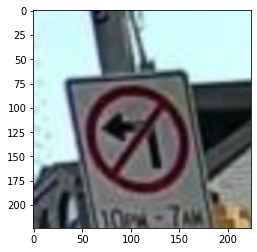

tensor([[-3.7759,  3.1587, -0.6869, -3.1139]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


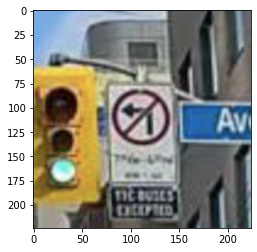

tensor([[-2.5062,  0.8673,  0.8584, -2.5696]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


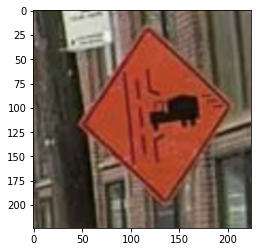

tensor([[-0.6687, -1.5104,  1.7822, -1.2634]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


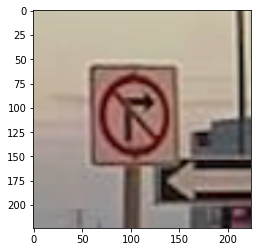

tensor([[-2.9560,  1.0056,  0.5888, -2.5612]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


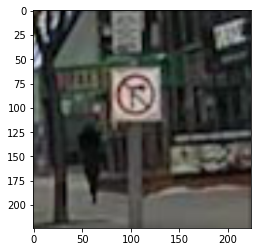

tensor([[-1.6326,  1.0570,  0.2736, -1.8276]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


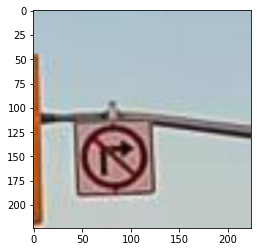

tensor([[-4.8681,  4.9396, -0.6942, -5.2305]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


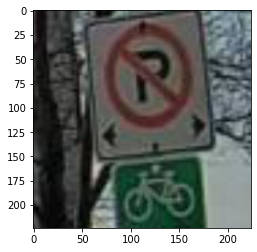

tensor([[-1.7787,  0.8621,  0.3281, -1.8231]], device='cuda:0',
       grad_fn=<AddmmBackward>)
test accuracy: 1.0


In [ ]:
best_model = CNN()
best_model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format("CNN", 256, 0.001, 5)
state = torch.load(best_model_path)
best_model.load_state_dict(state)
if use_cuda and torch.cuda.is_available():
    best_model.cuda()

test_dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
test_accuracy = get_test_accuracy(best_model, test_dataloader)
print("test accuracy:", test_accuracy)

#### classification stage 2

24


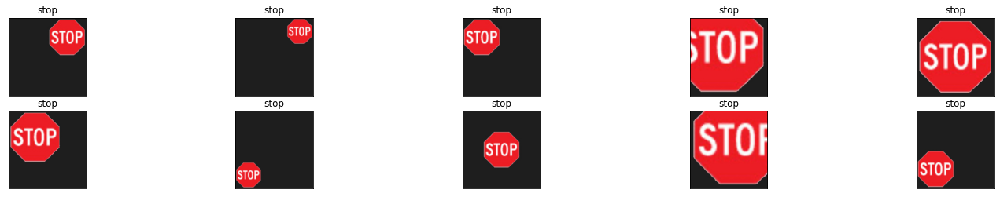

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/train_stop'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
stop_images, stop_labels = dataiter.next()
stop_images = stop_images.numpy() # convert images to numpy for display

classes = ['stop']
print(len(stop_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(stop_images[idx], (1, 2, 0)))
    ax.set_title(classes[stop_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def stop_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/train_stop/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
stop_data_augmentation(stop_images, stop_labels)

120


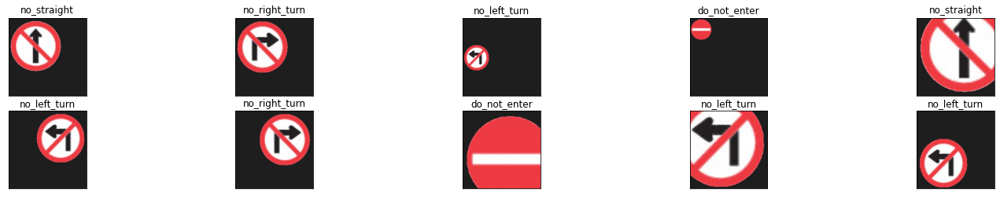

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/train_stage_2/regulatory'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
regulatory_images, regulatory_labels = dataiter.next()
regulatory_images = regulatory_images.numpy() # convert images to numpy for display

classes = ['do_not_enter', 'no_left_turn', 'no_right_turn', 'no_straight', 'no_u_turn']
print(len(regulatory_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(regulatory_images[idx], (1, 2, 0)))
    ax.set_title(classes[regulatory_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def regulatory_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/train_stage_2/regulatory/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
regulatory_data_augmentation(regulatory_images, regulatory_labels)

96


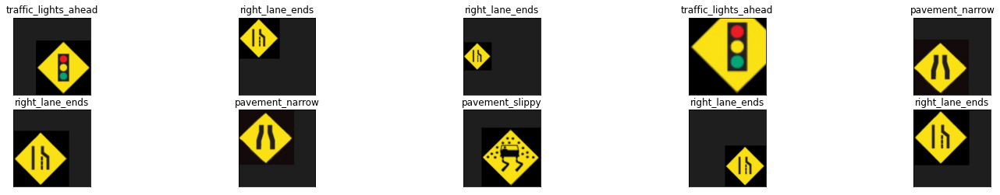

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/train_stage_2/warning'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
warning_images, warning_labels = dataiter.next()
warning_images = warning_images.numpy() # convert images to numpy for display

classes = ['pavement_narrow', 'pavement_slippy', 'right_lane_ends', 'traffic_lights_ahead']
print(len(warning_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(warning_images[idx], (1, 2, 0)))
    ax.set_title(classes[warning_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def warning_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/train_stage_2/warning/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
warning_data_augmentation(warning_images, warning_labels)

72


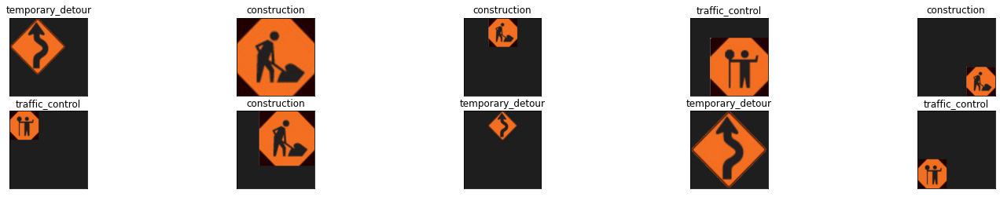

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/train_stage_2/temporary'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
temporary_images, temporary_labels = dataiter.next()
temporary_images = temporary_images.numpy() # convert images to numpy for display

classes = ['construction', 'temporary_detour', 'traffic_control']
print(len(temporary_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(temporary_images[idx], (1, 2, 0)))
    ax.set_title(classes[temporary_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def temporary_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/train_stage_2/temporary/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 9):
      change_in_color = (-20 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
temporary_data_augmentation(temporary_images, temporary_labels)

##### Regulatory

217


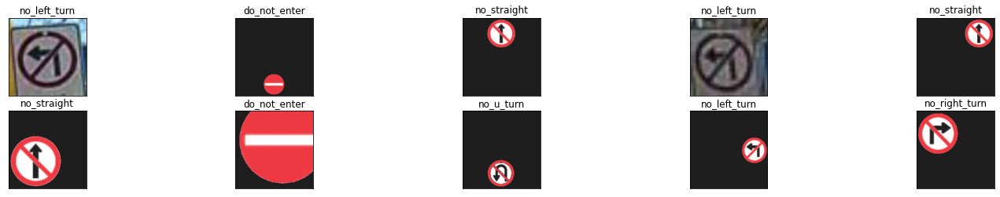

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/valid_stage_2/regulatory'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
valid_regulatory_images, valid_regulatory_labels = dataiter.next()
valid_regulatory_images = valid_regulatory_images.numpy() # convert images to numpy for display

classes = ['do_not_enter', 'no_left_turn', 'no_right_turn', 'no_straight', 'no_u_turn', 'stop']
print(len(valid_regulatory_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(valid_regulatory_images[idx], (1, 2, 0)))
    ax.set_title(classes[valid_regulatory_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def valid_regulatory_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/valid_stage_2/regulatory/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 5):
      change_in_color = (-10 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
valid_regulatory_data_augmentation(valid_regulatory_images, valid_regulatory_labels)

In [ ]:
class CNN_regulatory(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*220*220),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*110*110),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*106*106),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*53*53).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN_regulatory"
          super(CNN_regulatory, self).__init__()
          self.conv1 = nn.Conv2d(3, 5, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(5, 10, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(10*53*53, 32)
          self.fc2 = nn.Linear(32, 6)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 10*53*53)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          return x

In [ ]:
tdef get_accuracy(model, train_loader, valid_loader, train=False):
    if train:
        data = train_loader
    else:
        data = valid_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

In [ ]:
def train_regulatory(model, train_dataset, valid_dataset, batch_size=64, learning_rate=0.001, num_epochs=1):
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):
            #print(labels)
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch


        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
       

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is available!  Training on GPU ...
21
24
epoch number  1 accuracy:  0.16666666666666666
epoch number  2 accuracy:  0.16666666666666666
epoch number  3 accuracy:  0.23804012345679013
epoch number  4 accuracy:  0.38078703703703703
epoch number  5 accuracy:  0.4201388888888889
epoch number  6 accuracy:  0.5258487654320988
epoch number  7 accuracy:  0.6701388888888888
epoch number  8 accuracy:  0.8371913580246914
epoch number  9 accuracy:  0.8641975308641975
epoch number  10 accuracy:  0.8618827160493827
epoch number  11 accuracy:  0.90625
epoch number  12 accuracy:  0.9510030864197531
epoch number  13 accuracy:  0.964891975308642
epoch number  14 accuracy:  0.9571759259259259
epoch number  15 accuracy:  0.9814814814814815
epoch number  16 accuracy:  0.9837962962962963
epoch number  17 accuracy:  0.9868827160493827
epoch number  18 accuracy:  0.9922839506172839
epoch number  19 accuracy:  0.9938271604938271
epoch number  20 accuracy:  0.9972993827160493
epoch number  21 accuracy:  0.9

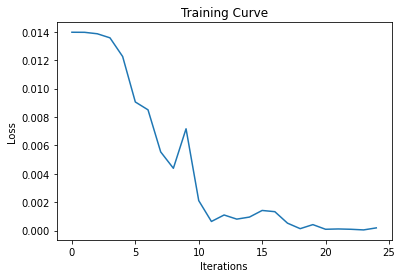

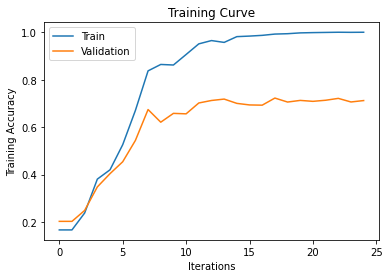

Final Training Accuracy: 1.0
Final Validation Accuracy: 0.7119815668202765


In [ ]:
train_path = '/content/drive/My Drive/aps360/train_stage_2/regulatory/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/valid_stage_2/regulatory/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN_regulatory()

use_cuda = True

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train_regulatory(model, train_dataset, val_dataset, 128, 0.002, num_epochs=25)

18
0


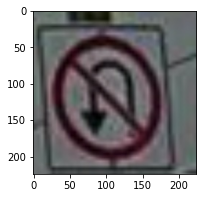

no_u_turn
1


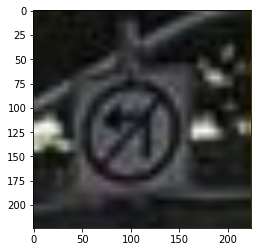

no_left_turn
2


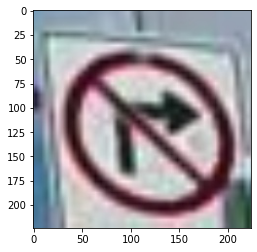

no_right_turn
3


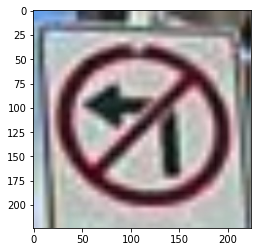

no_left_turn
4


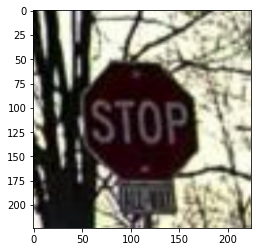

stop
5


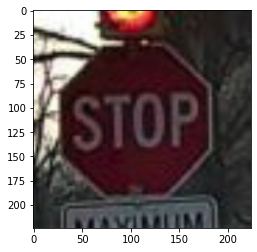

stop
6


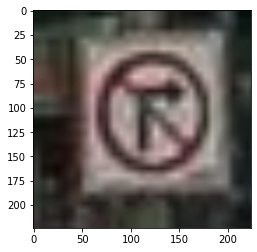

no_right_turn
7


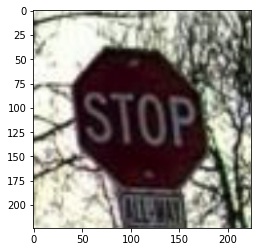

stop


In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_2/regulatory'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display
print(len(test_images))
classes = ['do_not_enter', 'no_left_turn', 'no_right_turn', 'no_straight', 'no_u_turn', 'stop']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 3))
for idx in np.arange(8):
    print(idx)
    #ax = fig.add_subplot(2, 8/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))
    plt.show()
    print(classes[test_labels[idx]])
    #ax.set_title(classes[test_labels[idx]])

In [ ]:
def get_test_accuracy(model, test_loader):
    data = test_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        imgs_1 = np.squeeze(imgs,axis = 0)
        print(imgs_1.shape)
        plt.imshow(np.transpose(imgs_1, (1, 2, 0)))
        plt.show()
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        print(output)
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

torch.Size([3, 224, 224])


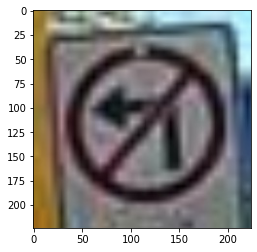

tensor([[  5.9753,  10.4152,  -4.2517, -10.5053,  -1.7218,   1.0131]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


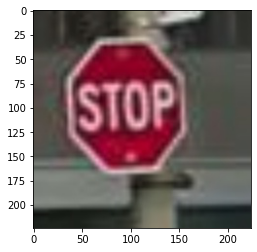

tensor([[ 1.0221,  3.2642,  0.2790,  4.1954, -3.8123,  5.1538]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


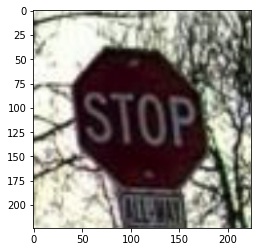

tensor([[ 17.5031,  -7.3159, -16.3863, -13.7008,  -5.3670,  24.3329]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


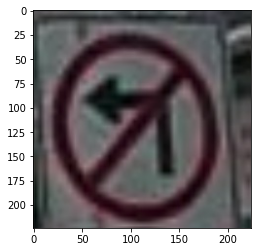

tensor([[-0.5775,  4.7110, -1.4200, -2.2464,  0.1709,  3.6921]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


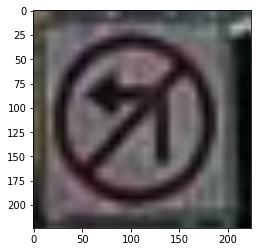

tensor([[-5.9279,  4.9852,  2.6916,  4.9744,  5.2053, -5.4626]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


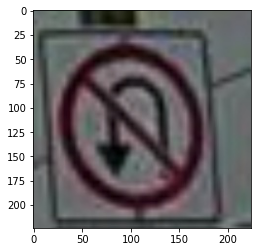

tensor([[ 2.6045, -2.7176, -1.6986, -2.6315,  1.3283,  7.8703]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


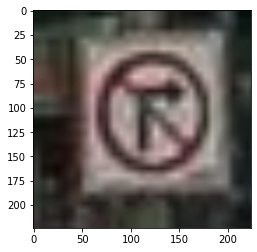

tensor([[-14.8858,   6.3102,  12.2173,  12.2188,  10.0398, -17.2691]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


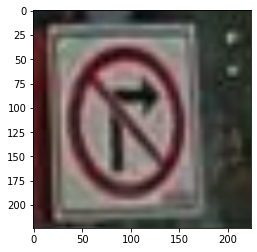

tensor([[ -7.6685,   9.2362,  11.9265,   3.7981,   8.5106, -18.7750]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


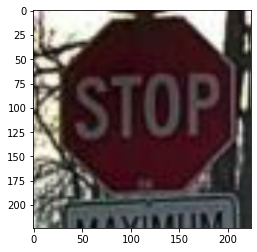

tensor([[ 20.7324,  -7.1001, -17.5211, -11.1996, -11.2084,  23.4552]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


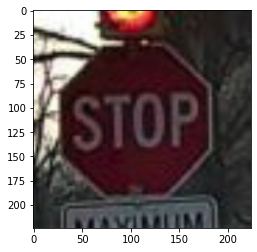

tensor([[10.1592, -3.1533, -8.6946, -8.6304, -5.8268, 18.3395]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


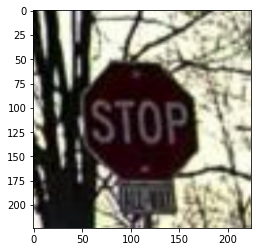

tensor([[  4.6665,  -5.2847,  -2.8237, -11.5889,  -5.9970,  18.3391]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


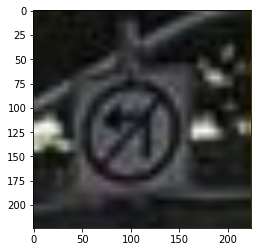

tensor([[-3.0090,  3.6190,  3.2836,  2.9993,  3.3872, -8.5801]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


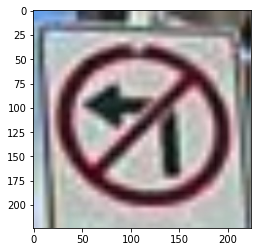

tensor([[  0.1897,  13.8194,  -3.4338, -11.9766,   4.4768,   3.7553]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


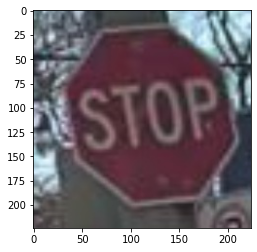

tensor([[ 19.3664,  -4.4894, -19.2122, -10.7390,  -7.6032,  20.8789]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


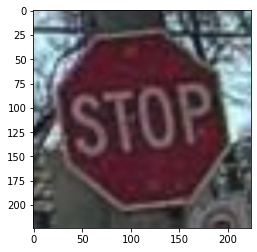

tensor([[ 19.7678,  -9.5339, -22.6226, -12.0586,  -3.4853,  27.8589]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


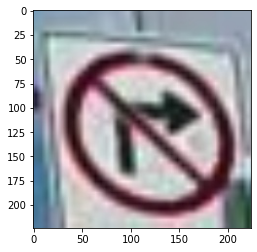

tensor([[-3.0058,  2.1271, 13.5309, -5.2922,  2.6807, -2.2269]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


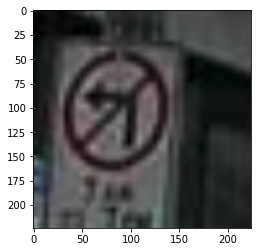

tensor([[-4.1494,  5.2603,  4.0727,  0.2967,  4.9378, -6.3292]],
       device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


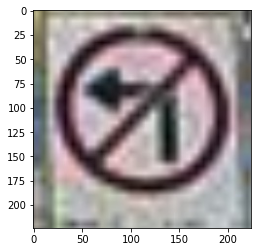

tensor([[ 4.7856,  7.4111, -4.7165, -3.7861, -0.4938,  1.5651]],
       device='cuda:0', grad_fn=<AddmmBackward>)
test accuracy: 0.8333333333333334


In [ ]:
best_model = CNN_regulatory()
best_model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format("CNN_regulatory", 128, 0.002, 22)
state = torch.load(best_model_path)
best_model.load_state_dict(state)
use_cuda = True
if use_cuda and torch.cuda.is_available():
    best_model.cuda()

test_dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
test_accuracy = get_test_accuracy(best_model, test_dataloader)
print("test accuracy:", test_accuracy)

##### Temporary

76


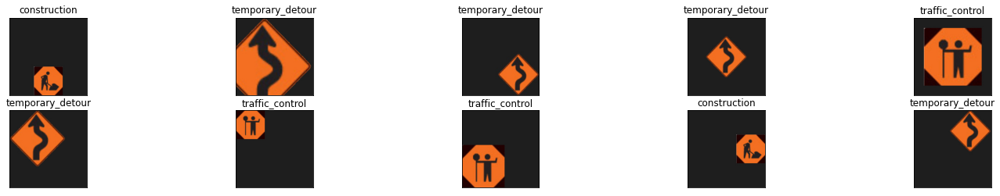

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/valid_stage_2/temporary'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
valid_temporary_images, valid_temporary_labels = dataiter.next()
valid_temporary_images = valid_temporary_images.numpy() # convert images to numpy for display

classes = ['construction', 'temporary_detour', 'traffic_control']
print(len(valid_temporary_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(valid_temporary_images[idx], (1, 2, 0)))
    ax.set_title(classes[valid_temporary_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def valid_temporary_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/valid_stage_2/temporary/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 5):
      change_in_color = (-10 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
valid_temporary_data_augmentation(valid_temporary_images, valid_temporary_labels)

In [ ]:
class CNN_temporary(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*220*220),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*110*110),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*106*106),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*53*53).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN_temporary"
          super(CNN_temporary, self).__init__()
          self.conv1 = nn.Conv2d(3, 5, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(5, 10, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(10*53*53, 32)
          self.fc2 = nn.Linear(32, 3)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 10*53*53)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          return x

In [ ]:
def train_temporary(model, train_dataset, valid_dataset, batch_size=64, learning_rate=0.001, num_epochs=1):
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):
            #print(labels)
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch


        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
       

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is available!  Training on GPU ...
11
9
epoch number  1 accuracy:  0.3654587509637625
epoch number  2 accuracy:  0.37393986121819583
epoch number  3 accuracy:  0.4263685427910563
epoch number  4 accuracy:  0.4155744024672321
epoch number  5 accuracy:  0.5751734772552043
epoch number  6 accuracy:  0.5466461063993832
epoch number  7 accuracy:  0.5250578257517348
epoch number  8 accuracy:  0.6854279105628374
epoch number  9 accuracy:  0.7401696222050886
epoch number  10 accuracy:  0.8535080956052429
epoch number  11 accuracy:  0.787201233616037
epoch number  12 accuracy:  0.6453353893600616
epoch number  13 accuracy:  0.8218966846569006
epoch number  14 accuracy:  0.8473400154202004
epoch number  15 accuracy:  0.9151888974556669
epoch number  16 accuracy:  0.9491133384734002
epoch number  17 accuracy:  0.961449498843485
epoch number  18 accuracy:  0.9622205088666153
epoch number  19 accuracy:  0.961449498843485
epoch number  20 accuracy:  0.9676175790285274
epoch number  21 accuracy:

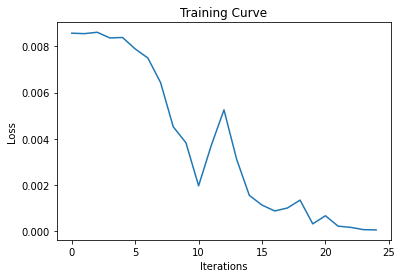

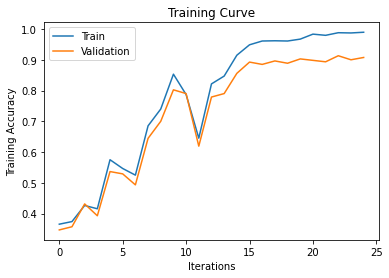

Final Training Accuracy: 0.9899768696993061
Final Validation Accuracy: 0.9078947368421053


In [ ]:
train_path = '/content/drive/My Drive/aps360/train_stage_2/temporary/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/valid_stage_2/temporary/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN_temporary()

use_cuda = True

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train_temporary(model, train_dataset, val_dataset, 128, 0.002, num_epochs=25)

3
0


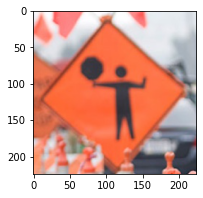

traffic_control
1


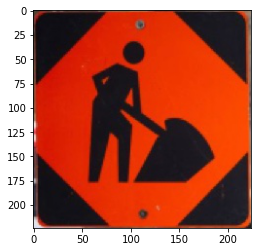

construction
2


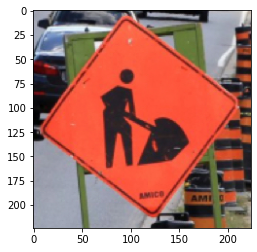

construction


In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_2/temporary'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display
print(len(test_images))
classes = ['construction', 'temporary_detour', 'traffic_control']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 3))
for idx in np.arange(3):
    print(idx)
    #ax = fig.add_subplot(2, 8/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))
    plt.show()
    print(classes[test_labels[idx]])
    #ax.set_title(classes[test_labels[idx]])

In [ ]:
def get_test_accuracy(model, test_loader):
    data = test_loader

    correct = 0
    total = 0
    for imgs, labels in data:
        
        imgs_1 = np.squeeze(imgs,axis = 0)
        print(imgs_1.shape)
        plt.imshow(np.transpose(imgs_1, (1, 2, 0)))
        plt.show()
        
        #############################################
        #To Enable GPU Usage
        if use_cuda and torch.cuda.is_available():
          imgs = imgs.cuda()
          labels = labels.cuda()
        #############################################
        
        
        output = model(imgs)
        
        #select index with maximum prediction score
        pred = output.max(1, keepdim=True)[1]
        print(output)
        correct += pred.eq(labels.view_as(pred)).sum().item()
        total += imgs.shape[0]
    return correct / total

torch.Size([3, 224, 224])


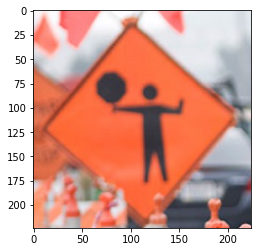

tensor([[ 7.6757, -9.1175,  8.9846]], device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


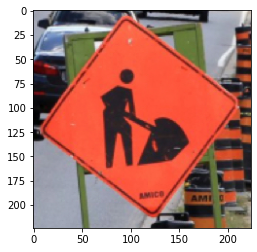

tensor([[ 4.4580, -2.9481,  4.0897]], device='cuda:0', grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


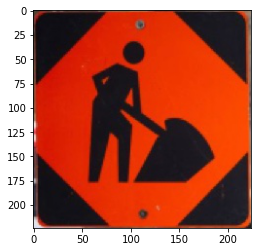

tensor([[-0.2471,  4.4010, -0.2664]], device='cuda:0', grad_fn=<AddmmBackward>)
test accuracy: 0.6666666666666666


In [ ]:
best_model = CNN_temporary()
best_model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format("CNN_temporary", 128, 0.002, 21)
state = torch.load(best_model_path)
best_model.load_state_dict(state)
use_cuda = True
if use_cuda and torch.cuda.is_available():
    best_model.cuda()

test_dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
test_accuracy = get_test_accuracy(best_model, test_dataloader)
print("test accuracy:", test_accuracy)

##### Warning

96


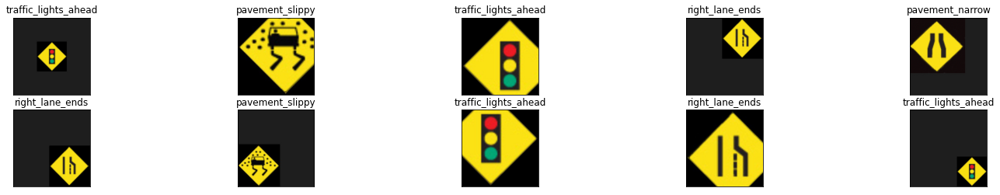

In [ ]:
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt

# location on Google Drive
master_path = '/content/drive/My Drive/aps360/valid_stage_2/warning'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
valid_warning_images, valid_warning_labels = dataiter.next()
valid_warning_images = valid_warning_images.numpy() # convert images to numpy for display

classes = ['pavement_narrow', 'pavement_slippy', 'right_lane_ends', 'traffic_lights_ahead']
print(len(valid_warning_images))
# plot the first 10 images, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 10/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(valid_warning_images[idx], (1, 2, 0)))
    ax.set_title(classes[valid_warning_labels[idx]])


In [ ]:
from skimage import transform
import matplotlib.image as mpimg
import random
from skimage.util import random_noise

In [ ]:
def valid_warning_data_augmentation(images, labels):
  model_path = '/content/drive/My Drive/aps360/valid_stage_2/warning/'
  torch.manual_seed(1)
  for i in range(len(images)):
    image = np.transpose(images[i], (1, 2, 0))
    vert = np.flipud(image)
    mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'vert.jpg', vert)
    rotate_angles = range(10, 30, 5)
    for index1 in range(0, len(rotate_angles)):
      rotate = transform.rotate(image, random.uniform(-rotate_angles[index1], rotate_angles[index1]))      
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'rotate' + str(index1) +'.jpg', rotate)
    for index2 in range(0, 3):
      noise = random_noise(image, mode='s&p', clip = True)
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'noise' + str(index2) +'.jpg', noise)
    for index3 in range(0, 5):
      change_in_color = (-10 + index3 * 5) / 100
      change_color = image + change_in_color
      
      for x in range(0, len(change_color[0])):
        for y in range(0, len(change_color[1])):
          for channel in range(0, 3):
            if change_color[x][y][channel]>1:
              change_color[x][y][channel]=1
            elif change_color[x][y][channel]<0:
              change_color[x][y][channel]=0
      mpimg.imsave(model_path + classes[labels[i]] + '/' + str(i) + 'change_color' + str(index3) +'.jpg', change_color)

In [ ]:
valid_warning_data_augmentation(valid_warning_images, valid_warning_labels)

In [ ]:
class CNN_warning(nn.Module):
      # my CNN module goes from input data (3*224*224) to con1 (input_channels = 3, output_channels = 5, kernel_size = 5), the size becomes (5*220*220),
      # then it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (5*110*110),
      # then it goes through a second con2 (input_channels = 5, output_channels = 10, kernel_size = 5), the size becomes (10*106*106),
      # finally it goes through an relu function and a maxpooling (kernal_size = 2, stride = 2), the size becomes (10*53*53).
      # there are a total of 7 layers, including 2 convolution layers, 2 maxpooling layers, 2 fully connected layers, and 1 output layer

      def __init__(self):
          self.name = "CNN_warning"
          super(CNN_warning, self).__init__()
          self.conv1 = nn.Conv2d(3, 5, 5) #in_channels=3, out_chanels=5, kernel_size=5
          self.pool = nn.MaxPool2d(2, 2) #kernel_size=2, stride=2 
          self.conv2 = nn.Conv2d(5, 10, 5) #in_channels=5, out_chanels=10, kernel_size=5
          self.fc1 = nn.Linear(10*53*53, 32)
          self.fc2 = nn.Linear(32, 4)

      def forward(self, x):
          x = self.pool(F.relu(self.conv1(x))) #relu activation function
          x = self.pool(F.relu(self.conv2(x))) #relu activation function
          x = x.view(-1, 10*53*53)
          x = F.relu(self.fc1(x)) #relu activation function
          x = self.fc2(x)
          return x

In [ ]:
def train_warning(model, train_dataset, valid_dataset, batch_size=64, learning_rate=0.001, num_epochs=1):
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)
    print(len(train_loader))
    print(len(valid_loader))
    iters, losses, train_acc, val_acc = [], [], [], []

    # training
    epoch = 0 # the number of iterations
    for epoch in range(num_epochs):
        for imgs, labels in iter(train_loader):
            #print(labels)
            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              imgs = imgs.cuda()
              labels = labels.cuda()
            #############################################
            
              
            out = model(imgs)             # forward pass
            loss = criterion(out, labels) # compute the total loss
            loss.backward()               # backward pass (compute parameter updates)
            optimizer.step()              # make the updates for each parameter
            optimizer.zero_grad()         # a clean up step for PyTorch


        # save the current training information
        iters.append(epoch)
        losses.append(float(loss)/batch_size)             # compute *average* loss
        train_acc.append(get_accuracy(model, train_loader, valid_loader, train=True)) # compute training accuracy
        print("epoch number ", epoch+1, "accuracy: ",train_acc[epoch]) 
        val_acc.append(get_accuracy(model, train_loader, valid_loader, train=False))  # compute validation accuracy
        model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format(model.name, batch_size, learning_rate, epoch)
        torch.save(model.state_dict(), model_path)
       

    # plotting
    plt.title("Training Curve")
    plt.plot(iters, losses, label="Train")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    plt.title("Training Curve")
    plt.plot(iters, train_acc, label="Train")
    plt.plot(iters, val_acc, label="Validation")
    plt.xlabel("Iterations")
    plt.ylabel("Training Accuracy")
    plt.legend(loc='best')
    plt.show()

    print("Final Training Accuracy: {}".format(train_acc[-1]))
    print("Final Validation Accuracy: {}".format(val_acc[-1]))

CUDA is available!  Training on GPU ...
14
11
epoch number  1 accuracy:  0.25
epoch number  2 accuracy:  0.25289351851851855
epoch number  3 accuracy:  0.30266203703703703
epoch number  4 accuracy:  0.28587962962962965
epoch number  5 accuracy:  0.29282407407407407
epoch number  6 accuracy:  0.2679398148148148
epoch number  7 accuracy:  0.34375
epoch number  8 accuracy:  0.3275462962962963
epoch number  9 accuracy:  0.34953703703703703
epoch number  10 accuracy:  0.3576388888888889
epoch number  11 accuracy:  0.3732638888888889
epoch number  12 accuracy:  0.38773148148148145
epoch number  13 accuracy:  0.3773148148148148
epoch number  14 accuracy:  0.3819444444444444
epoch number  15 accuracy:  0.4479166666666667
epoch number  16 accuracy:  0.42766203703703703
epoch number  17 accuracy:  0.5300925925925926
epoch number  18 accuracy:  0.6394675925925926
epoch number  19 accuracy:  0.5428240740740741
epoch number  20 accuracy:  0.6545138888888888
epoch number  21 accuracy:  0.70949074074

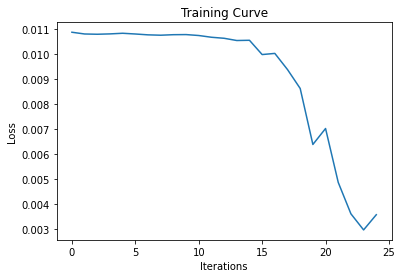

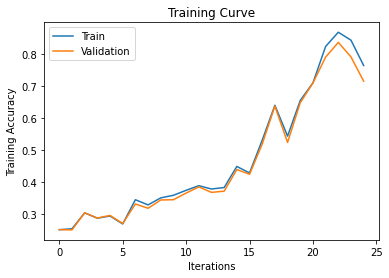

Final Training Accuracy: 0.7638888888888888
Final Validation Accuracy: 0.7150297619047619


In [ ]:
train_path = '/content/drive/My Drive/aps360/train_stage_2/warning/'
train_dataset = torchvision.datasets.ImageFolder(train_path, transform=transforms.ToTensor())

val_path = '/content/drive/My Drive/aps360/valid_stage_2/warning/'
val_dataset = torchvision.datasets.ImageFolder(val_path, transform=transforms.ToTensor())

model = CNN_warning()

use_cuda = True

if use_cuda and torch.cuda.is_available():
  model.cuda()
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')
  
#proper model
train_warning(model, train_dataset, val_dataset, 128, 0.002, num_epochs=25)

4
0


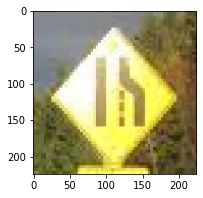

right_lane_ends
1


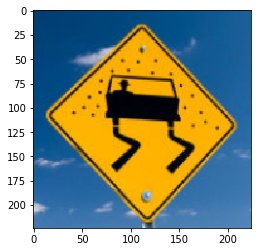

pavement_slippy
2


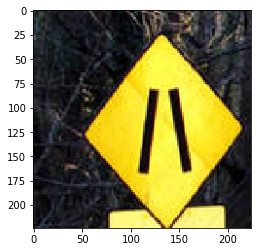

pavement_narrow


In [ ]:
# location on Google Drive
master_path = '/content/drive/My Drive/aps360/test_2/warning'

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((224,224)), 
                                transforms.ToTensor()])

# Load data from Google Drive
dataset = torchvision.datasets.ImageFolder(master_path, transform=transform)

# Prepare Dataloader
batch_size = len(dataset)
num_workers = 1
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

# Verification Step - obtain one batch of images
dataiter = iter(data_loader)
test_images, test_labels = dataiter.next()
test_images = test_images.numpy() # convert images to numpy for display
print(len(test_images))
classes = ['pavement_narrow', 'pavement_slippy', 'right_lane_ends', 'traffic_lights_ahead']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 3))
for idx in np.arange(3):
    print(idx)
    #ax = fig.add_subplot(2, 8/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(test_images[idx], (1, 2, 0)))
    plt.show()
    print(classes[test_labels[idx]])
    #ax.set_title(classes[test_labels[idx]])

torch.Size([3, 224, 224])


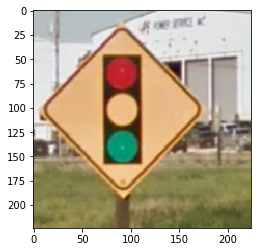

tensor([[  4.2257,   7.3102,   7.1185, -10.7285]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


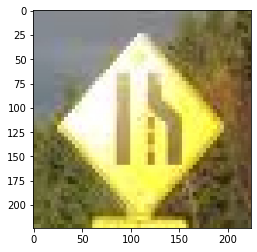

tensor([[  4.3233,   6.5906,   7.8426, -10.7456]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


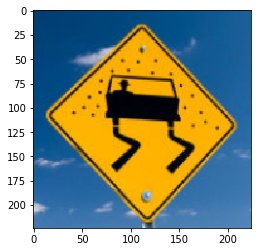

tensor([[  2.5116,   7.8199,   7.3580, -11.4313]], device='cuda:0',
       grad_fn=<AddmmBackward>)
torch.Size([3, 224, 224])


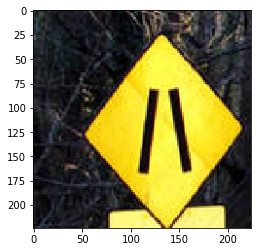

tensor([[ 7.0960, -0.7579,  5.9214, -5.4086]], device='cuda:0',
       grad_fn=<AddmmBackward>)
test accuracy: 0.75


In [ ]:
best_model = CNN_warning()
best_model_path = "model_{0}_bs{1}_lr{2}_epoch{3}".format("CNN_warning", 128, 0.002, 24)
state = torch.load(best_model_path)
best_model.load_state_dict(state)
use_cuda = True
if use_cuda and torch.cuda.is_available():
    best_model.cuda()

test_dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
test_accuracy = get_test_accuracy(best_model, test_dataloader)
print("test accuracy:", test_accuracy)